# Data Preprocessing

## Exploratory Data Analysis

In [1]:
from math import ceil, floor

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.preprocessing import OrdinalEncoder

from avalancheutils.data_preprocessing import adjust_column, compare_column_operation, data_overview, \
    decimal_to_hh_mm, \
    degrees_to_text, iqr_outlier_detection, missing_data_overview, unique_value_counts
from avalancheutils.elevation_model import ElevationModel
from avalancheutils.visualization import plot_boxplot, plot_histogram, plot_polar_bar, plot_heatmap, plot_incident_map

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 50)

### Loading the dataset

In [3]:
incidents = pd.read_csv('data/incidents_tirol.csv', parse_dates=['date'])
incidents.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3060 entries, 0 to 3059
Data columns (total 41 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   id                                3060 non-null   int64         
 1   date                              3060 non-null   datetime64[ns]
 2   valid_time                        3060 non-null   bool          
 3   location_longitude                3060 non-null   float64       
 4   location_latitude                 3060 non-null   float64       
 5   danger_rating_level               2297 non-null   float64       
 6   danger_rating_text                2323 non-null   object        
 7   danger_problem_text               487 non-null    object        
 8   involved_sum                      775 non-null    float64       
 9   involved_dead                     2919 non-null   float64       
 10  involved_injured                  2731 non-null 

In [4]:
incidents

,id,date,valid_time,location_longitude,location_latitude,danger_rating_level,danger_rating_text,danger_problem_text,involved_sum,involved_dead,involved_injured,involved_uninjured,involved_swept,involved_buried_total,involved_buried_partial,involved_not_buried,avalanche_extent_length,avalanche_extent_width,avalanche_breakheight,avalanche_type_text,avalanche_size_text,location_elevation,location_slope_angle,location_aspect_text,location_name,location_subregion_text,involved_equipment_standard_text,involved_equipment_lvs_text,involved_equipment_airbag_text,involved_ascent_descent_text,avalanche_release_text,avalanche_humidity_text,weather_temp,weather_snow_depth,weather_temp_mean,weather_temp_diff,weather_rain_sum,weather_snow_sum,weather_wind_speed_mean,weather_wind_dir_mean,weather_radiation_sum
0,9354,2018-02-17 11:34:00,True,11.98533,47.27433,3.0,considerable,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Katzenkopf,Westl. Kitzbüheler Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-1.072000,1.62,-11.436062,12.231251,0.400000,15.330001,1.765809,236.022186,30.590000
1,9355,2018-02-17 12:42:00,True,10.51200,47.04033,3.0,considerable,NaN,2.0,0.0,0.0,2.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,slab,NaN,NaN,NaN,NaN,Furglerscharte,Samnaungruppe,NaN,NaN,NaN,NaN,NaN,NaN,-5.520000,1.73,-13.941355,11.135417,0.100000,11.830001,2.170215,239.169565,27.330000
2,9347,2018-02-16 09:58:00,True,10.17150,46.88017,3.0,considerable,NaN,2.0,0.0,1.0,1.0,2.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,2150.0,40.0,NW,Jamtalhütte,Silvretta,NaN,NaN,NaN,NaN,NaN,NaN,-5.238000,2.12,-13.038000,9.931250,0.000000,9.170000,1.789226,271.672250,33.340000
3,9370,2018-02-22 14:20:00,True,10.30706,47.10953,2.0,moderate,NaN,2.0,0.0,0.0,2.0,2.0,0.0,0.0,NaN,450.0,100.0,40.0,slab,3: large avalanche,2650.0,40.0,SW,Hochkarspitze,Westl. Verwallgruppe,NaN,NaN,NaN,NaN,NaN,NaN,-11.348000,2.03,-15.169874,-2.739584,0.000000,1.260000,1.921453,140.138434,45.429996
4,9371,2018-02-21 15:24:00,True,10.28800,47.10217,2.0,moderate,NaN,3.0,0.0,0.0,3.0,2.0,0.0,2.0,NaN,250.0,120.0,30.0,slab,2: medium avalanche,2600.0,40.0,SE,Hinteres Rendl,Westl. Verwallgruppe,NaN,NaN,NaN,NaN,NaN,NaN,-12.007500,2.05,-12.555938,-4.852083,0.000000,2.590000,1.958323,328.446203,40.350000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3055,10871,2024-01-27 14:40:00,True,10.86917,46.93223,2.0,moderate,persistent_weak_layers,2.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,150.0,80.0,30.0,slab,2: medium avalanche,3040.0,35.0,S,Mittagskogel,Weißkugelgruppe,NaN,NaN,NaN,descent,artificial,dry,-9.252501,10.14,-7.532708,-8.310416,3.999999,16.310000,4.410570,295.006771,22.520000
3056,10817,2024-01-27 15:25:00,True,11.09482,46.99571,2.0,moderate,persistent_weak_layers,2.0,0.0,0.0,2.0,1.0,0.0,0.0,1.0,400.0,100.0,40.0,slab,2: medium avalanche,3140.0,45.0,SE,Daunkofelferner,Zentrale Stubaier Alpen,yes,yes,none,descent,artificial,dry,-11.929500,1.69,-8.196167,-7.350000,5.099999,16.939999,4.362330,305.166596,23.040000
3057,10873,2024-02-29 10:54:00,True,11.07445,46.88392,2.0,moderate,wind_slab,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,95.0,75.0,40.0,slab,2: medium avalanche,2800.0,45.0,NE,Wurmkogel,Gurgler Gruppe,NaN,NaN,NaN,descent,artificial,dry,-3.077000,1.89,-6.460854,2.887499,0.000000,14.140000,3.061700,172.783760,43.250000
3058,10874,2023-02-05 11:00:00,True,11.14106,47.13618,5.0,very high,wind_slab,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,100.0,20.0,20.0,slab,2: medium avalanche,2260.0,36.0,NE,St. Sigmund - Lüsens - Schöntal,Sellrain - Alpeiner Berge,yes,yes,all,descent,artificial,dry,-4.789000,1.02,-4.615563,-2.458334,0.000000,26.949999,2.545115,297.204999,20.220000


In [5]:
data_overview(incidents)

,Unique Values,Non-Null Values
involved_equipment_airbag_text,3,173
involved_not_buried,4,195
involved_equipment_lvs_text,2,205
involved_equipment_standard_text,2,225
involved_ascent_descent_text,3,411
avalanche_humidity_text,2,466
danger_problem_text,5,487
avalanche_release_text,2,492
avalanche_size_text,5,715
involved_sum,14,775


In [6]:
columns_to_drop = []

## Dataset exploration
## Date and Time
* Examined features: `date`, `valid_time`
* Each recorded incident includes both date and time information, with both of them stored in the ISO 8601 format (YYYY-MM-DD HH:MM:SS) in the `date` column. Additionally, there is a `valid_time` column containing a boolean flag indicating whether the recorded time (hours and minutes) in the `date` column is valid or not.
### Avalanche Incidents per Year

In [7]:
yearly_events = incidents['date'].dt.year
unique_value_counts(yearly_events, 'year')

Unique values for the property "year" (33 unique values and 3060 / 3060 non-null values):



date
2015    352
2009    189
2012    177
2010    165
2008    150
2013    145
2005    135
2021    117
2016    107
2018    103
2023    103
2014    102
2001     93
2011     88
2017     87
2006     82
2019     82
1999     81
2022     80
2000     76
2003     64
2002     59
2004     59
2024     58
2007     55
2020     53
1996     51
1997     39
1995     30
1993     29
1998     29
1994     18
1992      2
Name: count, dtype: int64

Before the year 2000, the number of reported avalanches per year was significantly lower. This can be attributed to the fact that the LAWIS system first became operational in Tirol in the early 2000s. Incidents reported prior to the winter season 2014/15 were sourced from archives maintained by individual avalanche warning services. We observe a significant spike in the number of incidents in 2015. This spike isn't supported by the information in the published avalanche season reports and we will examine it more closely further down.

In [8]:
monthly_events_2015 = incidents[incidents['date'].dt.year == 2015]['date'].dt.month
unique_value_counts(monthly_events_2015, 'months in 2015')

Unique values for the property "months in 2015" (8 unique values and 352 / 352 non-null values):



date
1     123
3     110
2      87
4      24
12      3
11      2
6       2
5       1
Name: count, dtype: int64

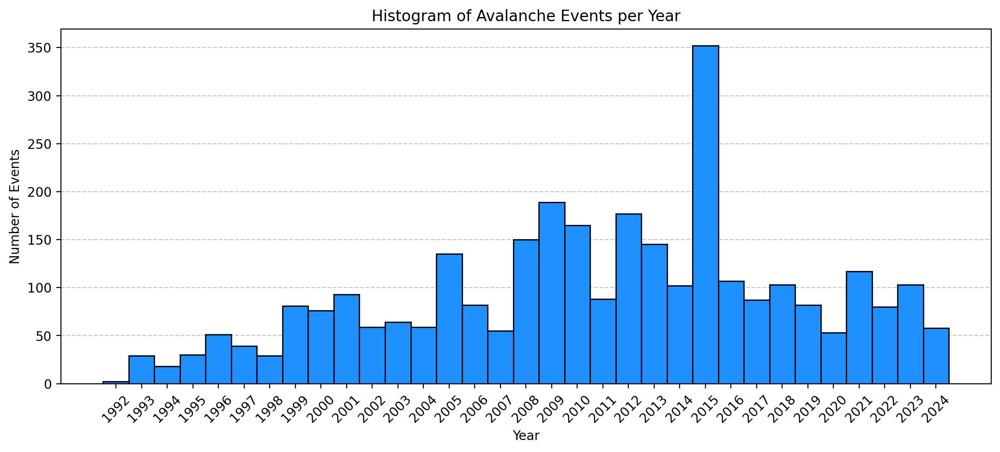

In [9]:
bins = range(yearly_events.min(), yearly_events.max() + 2)
plot_histogram(data=incidents['date'].dt.year, title='Histogram of Avalanche Events per Year', x_label='Year',
               y_label='Number of Events', bins=bins, x_ticks_labels=bins[:-1], figsize=(13, 5), rotation=45)
plt.show()

### Avalanche Events per Month

In [10]:
monthly_events = incidents['date'].dt.month
display(unique_value_counts(incidents['date'].dt.month, 'month'))

Unique values for the property "month" (11 unique values and 3060 / 3060 non-null values):



date
2     882
1     695
3     656
12    376
4     266
11     80
5      63
10     23
6      11
9       6
7       2
Name: count, dtype: int64

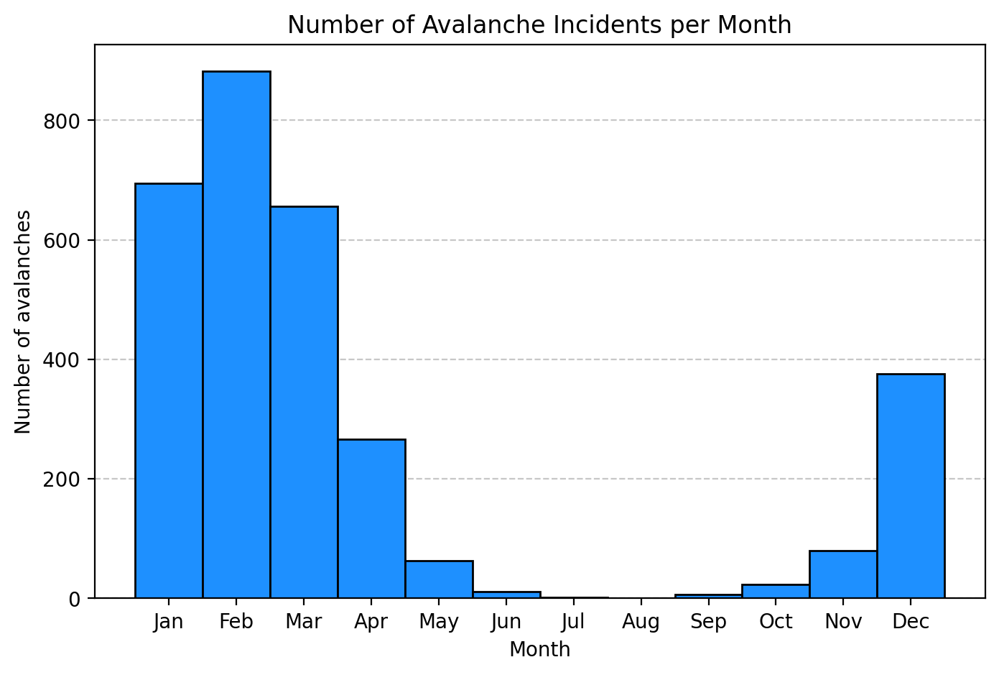

In [11]:
plot_histogram(data=monthly_events, title='Number of Avalanche Incidents per Month', x_label='Month',
               y_label='Number of avalanches', bins=range(1, 14),
               x_ticks_labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],
               figsize=(8, 5))
plt.show()

### Hourly Distribution of Avalanche Events

In [12]:
incidents['decimal_time'] = incidents['date'].dt.hour + incidents['date'].dt.minute / 60

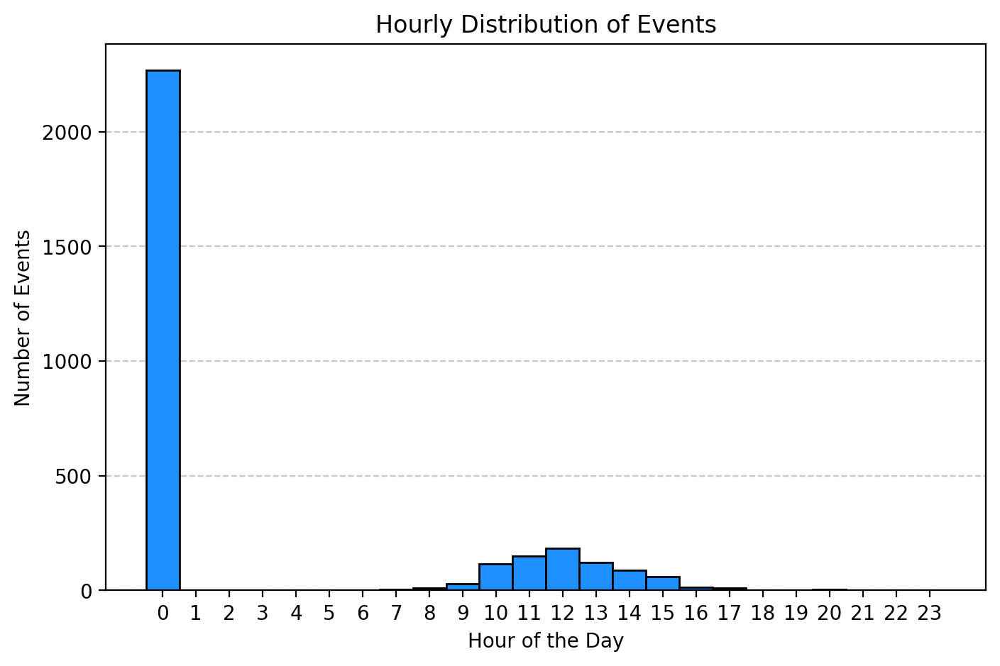

In [13]:
fig = plot_histogram(data=incidents['decimal_time'], title='Hourly Distribution of Events', x_label='Hour of the Day',
                     y_label='Number of Events', bins=range(25), x_ticks_labels=range(24))
plt.show()

Observing the dataset, it's apparent that the majority of recorded incidents have their event times set to midnight. Let's examine the distribution specifically for the instances categorized as valid times.

In [14]:
unique_value_counts(incidents['valid_time'], 'valid_time')

Unique values for the property "valid_time" (2 unique values and 3060 / 3060 non-null values):



valid_time
True     3005
False      55
Name: count, dtype: int64

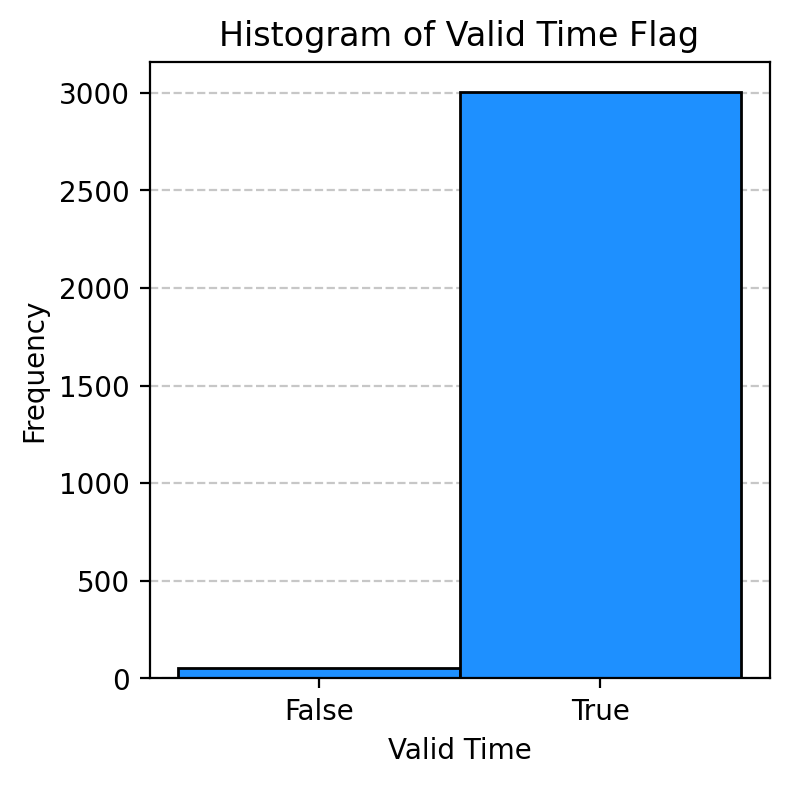

In [15]:
plot_histogram(data=incidents['valid_time'].astype(int), title='Histogram of Valid Time Flag', x_label='Valid Time',
               y_label='Frequency', bins=range(3), x_ticks_labels=['False', 'True'], figsize=(4, 4))
plt.show()

In [16]:
valid_time = (incidents[incidents['valid_time']])['decimal_time']

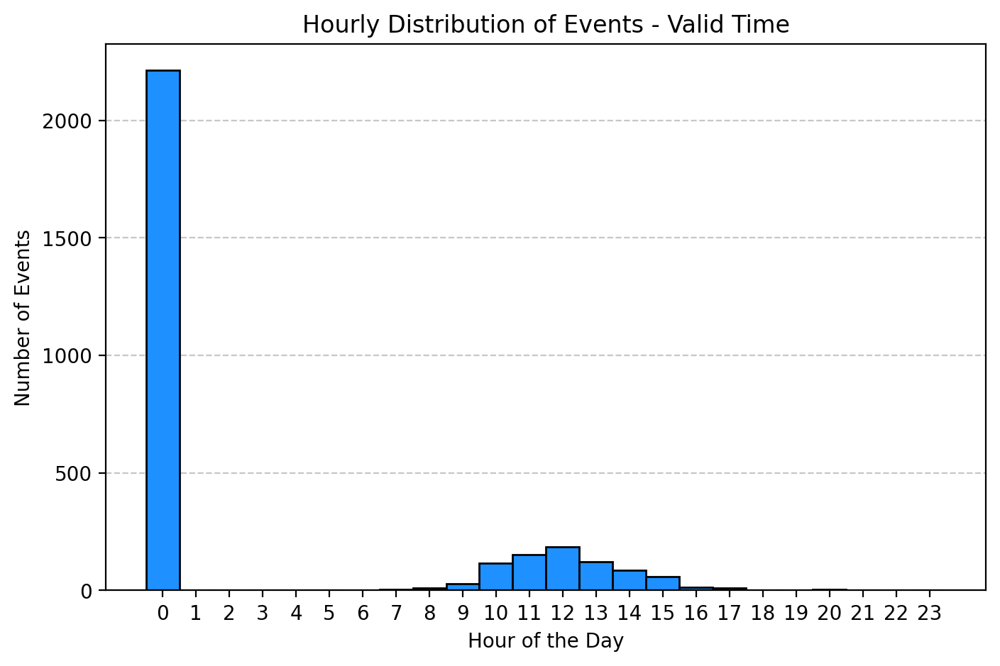

In [17]:
plot_histogram(data=valid_time, title='Hourly Distribution of Events - Valid Time', x_label='Hour of the Day',
               y_label='Number of Events', bins=range(25), x_ticks_labels=range(24))
plt.show()

In [18]:
print("Unique values of hours for non-valid times:",
      int(*incidents[incidents['valid_time'] == False]['decimal_time'].unique()))

Unique values of hours for non-valid times: 0


We can assume that the flag is not consistently used. Consequently, many records that should not have a valid time are marked as valid. Therefore, we can adjust this column by properly assigning the boolean values based on whether the time is valid (i.e., after 00:00) or not.

In [19]:
incidents['valid_time'] = incidents['date'].dt.time > pd.Timestamp('00:00:00').time()

In [20]:
display(unique_value_counts(incidents['valid_time'], 'valid_time'))

Unique values for the property "valid_time" (2 unique values and 3060 / 3060 non-null values):



valid_time
False    2268
True      792
Name: count, dtype: int64

In [21]:
display(unique_value_counts(incidents['date'].dt.hour, 'hour'))

Unique values for the property "hour" (16 unique values and 3060 / 3060 non-null values):



date
0     2268
12     185
11     151
13     121
10     116
14      87
15      60
9       28
16      14
17      11
8       10
20       3
7        3
19       1
18       1
4        1
Name: count, dtype: int64

We can see that apart from the wrongly timed incidents, no avalanches are reported during the night (between 23 and 4). Let's take a closer look at the distribution of the remaining incidents during the day.

In [22]:
valid_hours = (incidents[incidents['valid_time'] == True])['decimal_time']
print(
    f"Total number of records with valid hours: {len(valid_hours)}, which is {len(valid_hours) / len(incidents) * 100:.2f}% of the whole dataset.")

Total number of records with valid hours: 792, which is 25.88% of the whole dataset.


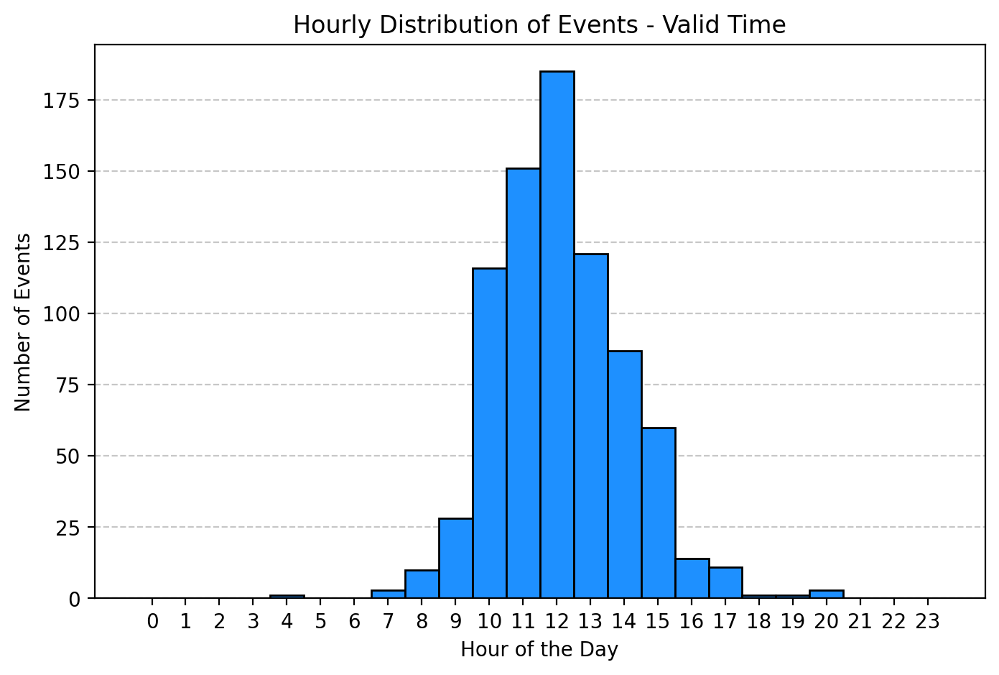

In [23]:
plot_histogram(data=valid_hours, title='Hourly Distribution of Events - Valid Time', x_label='Hour of the Day',
               y_label='Number of Events', bins=range(25), x_ticks_labels=range(24))
plt.show()

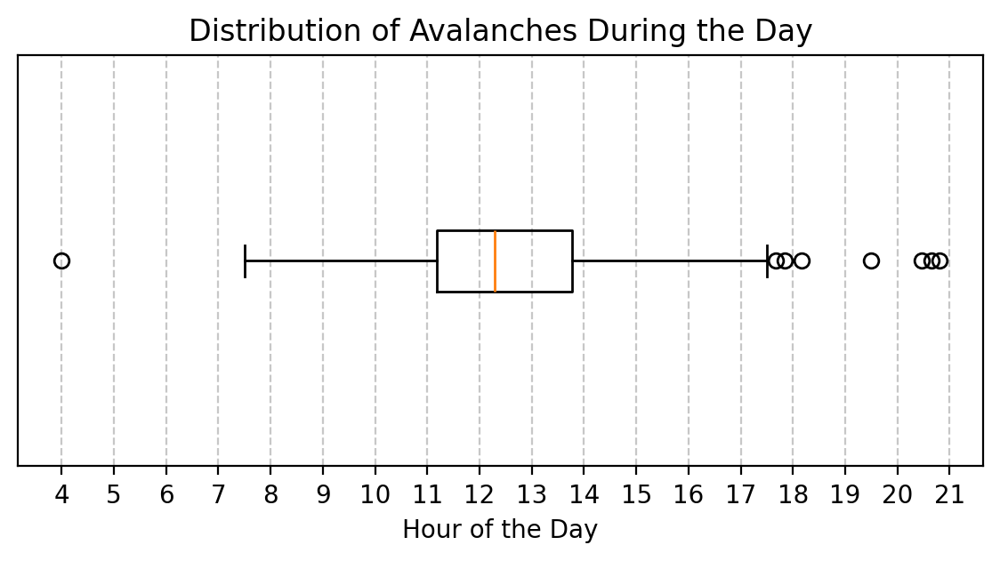

In [24]:
plot_boxplot(valid_hours, x_label='Hour of the Day', y_label='', x_ticks=range(floor(valid_hours.min()), ceil(valid_hours.max()) + 1), title='Distribution of Avalanches During the Day')
plt.show()

In [25]:
valid_hours.describe().drop('count').apply(decimal_to_hh_mm)

mean    12:32:00
std     01:55:00
min     04:00:00
25%     11:10:00
50%     12:17:00
75%     13:46:00
max     20:48:00
Name: decimal_time, dtype: object

We can see that there are some outliers present according to the boxplot:

In [26]:
outliers = iqr_outlier_detection(valid_hours).apply(decimal_to_hh_mm).sort_values()
outliers

3059    04:00:00
2773    17:40:00
2506    17:49:00
2974    18:10:00
2479    19:30:00
14      20:27:00
2444    20:38:00
613     20:48:00
Name: decimal_time, dtype: object

In [27]:
incidents.iloc[outliers.index]

,id,date,valid_time,location_longitude,location_latitude,danger_rating_level,danger_rating_text,danger_problem_text,involved_sum,involved_dead,involved_injured,involved_uninjured,involved_swept,involved_buried_total,involved_buried_partial,involved_not_buried,avalanche_extent_length,avalanche_extent_width,avalanche_breakheight,avalanche_type_text,avalanche_size_text,location_elevation,location_slope_angle,location_aspect_text,location_name,location_subregion_text,involved_equipment_standard_text,involved_equipment_lvs_text,involved_equipment_airbag_text,involved_ascent_descent_text,avalanche_release_text,avalanche_humidity_text,weather_temp,weather_snow_depth,weather_temp_mean,weather_temp_diff,weather_rain_sum,weather_snow_sum,weather_wind_speed_mean,weather_wind_dir_mean,weather_radiation_sum,decimal_time
3059,10875,2024-02-28 04:00:00,True,10.32329,47.00862,2.0,moderate,gliding_snow,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,800.0,75.0,NaN,gliding,3: large avalanche,2300.0,NaN,SW,Velilltal,Samnaungruppe,NaN,NaN,NaN,NaN,spontaneous,dry,-7.5805,2.06,-6.834666,6.606250,0.1,6.300001,2.540511,144.665483,46.530003,4.000000
2773,10212,2021-02-23 17:40:00,True,11.41332,47.31701,3.0,considerable,wet_snow,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,700.0,50.0,40.0,slab,3: large avalanche,1950.0,36.0,S,Arzler Reise,Karwendel,NaN,NaN,NaN,descent,NaN,wet,4.6475,0.97,1.063646,3.125000,0.0,0.000000,1.641969,259.045006,54.540000,17.666667
2506,9531,2018-12-20 17:50:00,True,11.62911,47.11158,2.0,moderate,wind_slab,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,100.0,130.0,NaN,slab,2: medium avalanche,2340.0,40.0,N,Napfnjöchl,Westl. Tuxer Alpen,NaN,NaN,NaN,descent,artificial,dry,-8.7290,0.58,-8.102439,-0.531251,0.0,0.910000,2.108218,219.318276,18.190000,17.833333
2974,10704,2023-04-21 18:10:00,True,10.82741,46.79015,3.0,considerable,persistent_weak_layers,4.0,0.0,0.0,4.0,1.0,0.0,1.0,0.0,NaN,NaN,NaN,slab,NaN,2890.0,NaN,NW,Fineilspitze,Gurgler Gruppe,yes,NaN,none,descent,artificial,NaN,-6.2090,9.96,-6.534000,-0.543750,0.0,4.130001,1.945631,73.713164,90.469990,18.166667
2479,9472,2018-11-03 19:30:00,True,10.92780,46.93360,NaN,not assigned,NaN,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,700.0,250.0,40.0,NaN,NaN,2980.0,34.0,NE,Rettenbachferner,Weißkugelgruppe,NaN,NaN,NaN,NaN,artificial,dry,-1.3835,9.36,-4.041833,3.891667,0.0,10.010000,3.541153,158.799385,31.110000,19.500000
14,9391,2018-03-02 20:28:00,True,10.31600,47.06317,3.0,considerable,NaN,1.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,slab,NaN,NaN,NaN,NaN,Niederelbehütte,Östl. Verwallgruppe,NaN,NaN,NaN,NaN,NaN,NaN,-8.3910,1.97,-16.280584,16.297918,0.1,4.410000,2.297772,155.377747,50.530000,20.466667
2444,9299,2018-01-04 20:39:00,True,11.06589,47.22100,4.0,high,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,slab,4: very large avalanche,1800.0,NaN,S,Sellraintalstraße,Grieskogelgruppe,NaN,NaN,NaN,NaN,NaN,NaN,0.9615,1.51,-4.113500,2.812499,1.9,35.140000,2.437648,217.287702,11.310000,20.650000
613,299,2016-01-26 20:48:00,True,11.75711,47.23388,3.0,considerable,NaN,1.0,0.0,0.0,1.0,1.0,1.0,0.0,NaN,160.0,30.0,60.0,slab,2: medium avalanche,2150.0,40.0,E,Kleiner Gilfert,Östl. Tuxer Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-2.9745,0.72,-6.550541,8.600001,0.1,2.240000,1.745967,41.682011,25.150000,20.800000


These values represent the outliers displayed in the boxplot. They appear to be quite plausible, and I believe they should be retained in the dataset.

#### Checking for Duplicities
Now when the `valid_time` flag works as expected, we can revise potential duplicate records. We will group the incidents by their location and date and see if there are any suspicious groups.

In [28]:
datetime_duplicities = incidents[incidents['valid_time'] == True].groupby(
    ['date', 'location_longitude', 'location_latitude']).filter(lambda x: len(x) >= 2)
datetime_duplicities

,id,date,valid_time,location_longitude,location_latitude,danger_rating_level,danger_rating_text,danger_problem_text,involved_sum,involved_dead,involved_injured,involved_uninjured,involved_swept,involved_buried_total,involved_buried_partial,involved_not_buried,avalanche_extent_length,avalanche_extent_width,avalanche_breakheight,avalanche_type_text,avalanche_size_text,location_elevation,location_slope_angle,location_aspect_text,location_name,location_subregion_text,involved_equipment_standard_text,involved_equipment_lvs_text,involved_equipment_airbag_text,involved_ascent_descent_text,avalanche_release_text,avalanche_humidity_text,weather_temp,weather_snow_depth,weather_temp_mean,weather_temp_diff,weather_rain_sum,weather_snow_sum,weather_wind_speed_mean,weather_wind_dir_mean,weather_radiation_sum,decimal_time
271,9268,2017-12-19 12:08:00,True,12.41867,46.81433,3.0,considerable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,slab,2: medium avalanche,NaN,NaN,SW,Gabesitten,Östl. Deferegger Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-13.270,1.06,-17.163229,-2.141665,0.0,0.14,1.716622,320.755246,22.94,12.133333
2433,9279,2017-12-19 12:08:00,True,12.41867,46.81433,3.0,considerable,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,slab,1: small avalanche,2400.0,NaN,SW,Gabesitten,Östl. Deferegger Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-13.270,1.06,-17.163229,-2.141665,0.0,0.14,1.716622,320.755246,22.94,12.133333
2521,9683,2019-02-02 13:59:00,True,11.78929,47.32084,3.0,considerable,wind_slab,2.0,0.0,0.0,2.0,2.0,1.0,0.0,NaN,100.0,40.0,30.0,slab,2: medium avalanche,2335.0,35.0,N,Skigebiet Hochfügen,Östl. Tuxer Alpen,yes,yes,none,descent,artificial,dry,-0.883,1.51,-8.590813,7.079169,1.2,11.62,2.534252,247.226156,25.06,13.983333
2623,9682,2019-02-02 13:59:00,True,11.78929,47.32084,3.0,considerable,wind_slab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1960.0,35.0,E,Geolsalm,Östl. Tuxer Alpen,yes,yes,none,descent,artificial,dry,-0.883,1.51,-8.590813,7.079169,1.2,11.62,2.534252,247.226156,25.06,13.983333


Indeed, there are two events that seem to be duplicated. As the later records have more information included, they will be kept in the dataset and the earlier records will be removed.

In [29]:
max_ids_index = datetime_duplicities.groupby(['date', 'location_longitude', 'location_latitude'])['id'].idxmax()

In [30]:
incidents = incidents.drop(datetime_duplicities.index.difference(max_ids_index))

### Distribution of the Incidents per Days of the Week

In [31]:
week_days = incidents['date'].dt.dayofweek
display(unique_value_counts(week_days, 'week_days'))

Unique values for the property "week_days" (7 unique values and 3058 / 3058 non-null values):



date
5    728
6    617
4    392
2    350
3    336
1    323
0    312
Name: count, dtype: int64

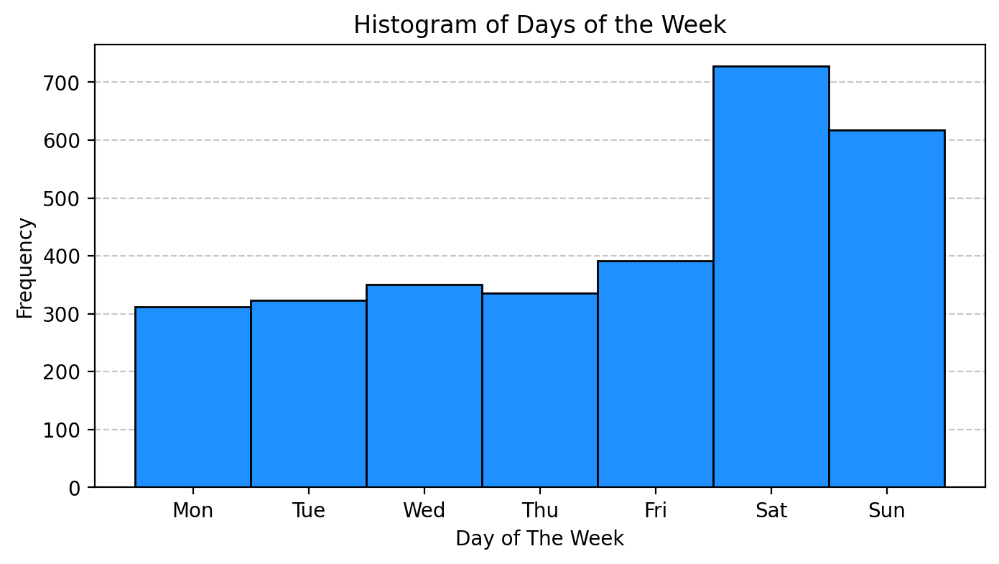

In [32]:
plot_histogram(data=week_days, title='Histogram of Days of the Week', x_label='Day of The Week', y_label='Frequency',
               bins=range(8), x_ticks_labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'], figsize=(8, 4))
plt.show()

We can clearly percieve a rising trend in the number of incidents during individual days of the week. This tendency culminates during the weekend, with the highest number of avalanche cases during the week being on the weekend days. On Saturday it is almost double of the daily average during the weekdays (Monday - Friday). It's very likely that this is caused by higher human presence in the mountains resulting in more frequent dangerous situations.

In [33]:
incidents['week_day'] = week_days

It makes sense to keep this information in a separate column in order to use it later during modelling.

## Danger Characteristics
* Examined features: `danger_rating_text`, `danger_rating_level`, `danger_problem_text`

In [34]:
missing_data_overview(data=incidents.filter(regex='^danger'))

,Non-Null Values (%),Unique Values,Non-Null Values
Feature Name,,,
danger_rating_text,75.899281,6,2321
danger_rating_level,75.049052,5,2295
danger_problem_text,15.892740,5,486


### Danger Level

Recorded danger levels are in two columns: `danger_rating_text` and `danger_rating_level`. But both of these columns have a different number of non-null values. 

In [35]:
unique_value_counts(incidents['danger_rating_text'], 'danger_rating_text')

Unique values for the property "danger_rating_text" (6 unique values and 2321 / 3058 non-null values):



danger_rating_text
considerable    1384
moderate         649
high             179
low               76
not assigned      26
very high          7
Name: count, dtype: int64

In [36]:
unique_value_counts(incidents['danger_rating_level'], 'danger_rating_level')

Unique values for the property "danger_rating_level" (5 unique values and 2295 / 3058 non-null values):



danger_rating_level
3.0    1384
2.0     649
4.0     179
1.0      76
5.0       7
Name: count, dtype: int64

As we can see, all the values are matching, except that there is one category more in the `danger_rating_text` column - `not assigned`. This category has the same number of values as the difference between the two columns. For further analysis, we only need `danger_rating_text` as it contains more information. 

In [37]:
columns_to_drop.append('danger_rating_level')

For easier manipulation it is better to map the danger ratings to their corresponding numerical values, with `not assigned` being a 0. 

In [38]:
incidents['danger_rating_text'] = OrdinalEncoder(
    categories=[['not assigned', 'low', 'moderate', 'considerable', 'high', 'very high']],
    handle_unknown='use_encoded_value', unknown_value=np.nan).fit_transform(incidents[['danger_rating_text']])

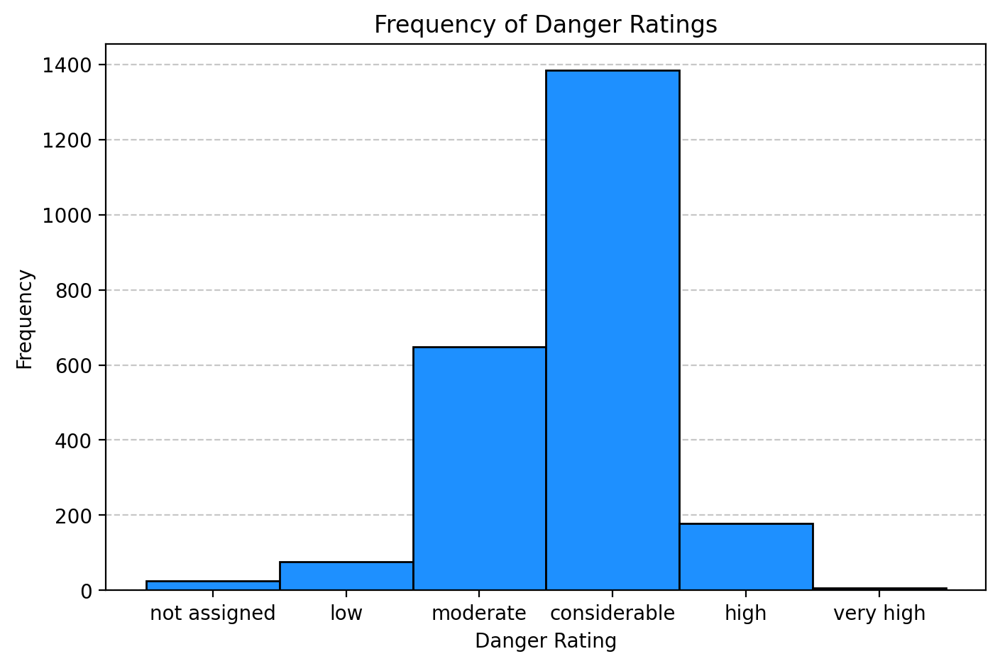

In [39]:
plot_histogram(incidents['danger_rating_text'], title='Frequency of Danger Ratings', x_label='Danger Rating',
               y_label='Frequency',
               bins=range(7), x_ticks_labels=['not assigned', 'low', 'moderate', 'considerable', 'high', 'very high'])
plt.show()

The majority of incidents occurred when the avalanche danger rating was at level 3 (considerable). Additionally, there is a significant number of incidents associated with the moderate danger rating, which tends to be the [predominant](https://static.avalanche.report/season_reports/AT-07/OeBericht_2022_2023.pdf) danger rating during the winter in Tirol.


### Danger Problem

In [40]:
display(unique_value_counts(incidents['danger_problem_text'], 'Danger Problem'))

Unique values for the property "Danger Problem" (5 unique values and 486 / 3058 non-null values):



danger_problem_text
wind_slab                 214
persistent_weak_layers    211
new_snow                   32
gliding_snow               16
wet_snow                   13
Name: count, dtype: int64

In [41]:
# OrdinalEncoder helps us to encode the categories into numerical format, but as this category is nominal it is purely for plotting purposes
danger_problems = OrdinalEncoder(
    categories=[['new_snow', 'wind_slab', 'persistent_weak_layers', 'wet_snow', 'gliding_snow']],
    handle_unknown='use_encoded_value', unknown_value=np.nan).fit_transform(incidents[['danger_problem_text']])

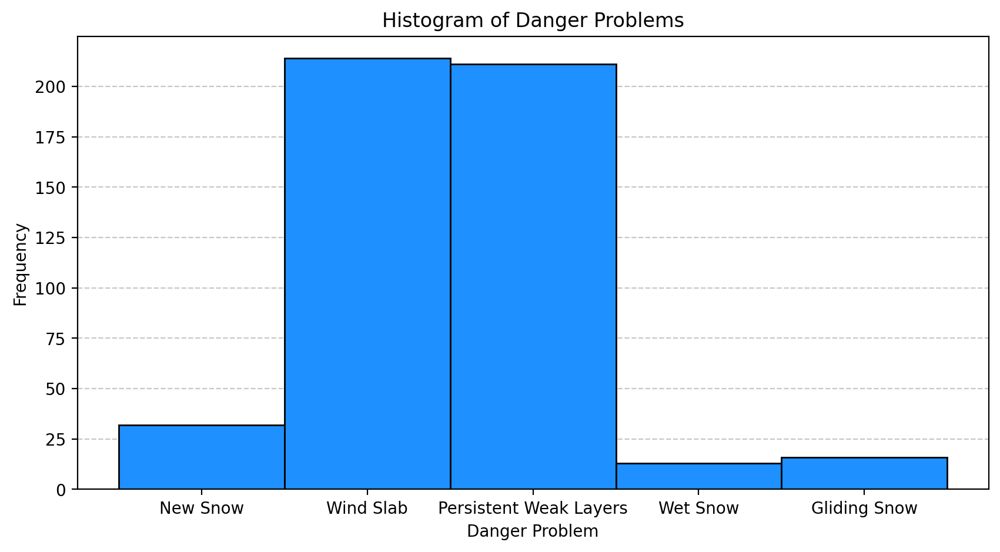

In [42]:
plot_histogram(data=danger_problems, title='Histogram of Danger Problems', x_label='Danger Problem',
               y_label='Frequency', bins=range(0, 6),
               x_ticks_labels=['New Snow', 'Wind Slab', 'Persistent Weak Layers', 'Wet Snow', 'Gliding Snow'], figsize=(10,5))
plt.show()

## Geographical Conditions
* Examined features: `location_aspect_text`, `location_slope_angle`, `location_longitude`, `location_latitude`, `location_elevation`, `location_subregion_text`, `location_elevation`, `location_name`

In [43]:
missing_data_overview(data=incidents.filter(regex='^location'), threshold=101, missing_cols_idx=False)

,Non-Null Values (%),Unique Values,Non-Null Values
Feature Name,,,
location_longitude,100.000000,3051,3058
location_latitude,100.000000,3048,3058
location_name,100.000000,2337,3058
location_subregion_text,100.000000,38,3058
location_elevation,76.389797,332,2336
location_aspect_text,72.498365,8,2217
location_slope_angle,60.954872,29,1864


### Categorical Features
* `location_subregion_text` contains the German string representation of the EAWS region where the incident took place
* `location_name` contains the name of the location, these are not standardized and depend on the person that recorded the event

### Incident Coordinates
Let's start by visualizing all the recorded events on a heatmap (you can toggle its visibility).

In [44]:
map_data = incidents[['date', 'location_name', 'location_latitude', 'location_longitude']]
plot_incident_map(data=map_data, lat_idx='location_latitude', lon_idx='location_longitude', popup_data=True, zoom=9,
                  heatmap=True)

We can see that there is a record with incorrectly recorded longitude, resulting for the record to be outside of Tyrol. All such data points will be removed.

In [45]:
tirol_bounds = {
    'top_left': {'lat': 47.8, 'lon': 10.1},
    'bottom_right': {'lat': 46.5, 'lon': 13.0}
}
records_outside_tirol = incidents[
    ~(
            (incidents['location_latitude'] >= tirol_bounds['bottom_right']['lat']) &
            (incidents['location_latitude'] <= tirol_bounds['top_left']['lat']) &
            (incidents['location_longitude'] >= tirol_bounds['top_left']['lon']) &
            (incidents['location_longitude'] <= tirol_bounds['bottom_right']['lon'])
    )
]
records_outside_tirol

,id,date,valid_time,location_longitude,location_latitude,danger_rating_level,danger_rating_text,danger_problem_text,involved_sum,involved_dead,involved_injured,involved_uninjured,involved_swept,involved_buried_total,involved_buried_partial,involved_not_buried,avalanche_extent_length,avalanche_extent_width,avalanche_breakheight,avalanche_type_text,avalanche_size_text,location_elevation,location_slope_angle,location_aspect_text,location_name,location_subregion_text,involved_equipment_standard_text,involved_equipment_lvs_text,involved_equipment_airbag_text,involved_ascent_descent_text,avalanche_release_text,avalanche_humidity_text,weather_temp,weather_snow_depth,weather_temp_mean,weather_temp_diff,weather_rain_sum,weather_snow_sum,weather_wind_speed_mean,weather_wind_dir_mean,weather_radiation_sum,decimal_time,week_day
2547,9720,2019-03-12 13:46:00,True,47.19282,47.19282,3.0,3.0,new_snow,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,slab,NaN,1860.0,30.0,SE,Skigebiet Serfaus,Samnaungruppe,NaN,NaN,NaN,descent,artificial,dry,12.424,0.0,7.081812,4.1875,3.3,0.0,7.807159,203.884644,49.38,13.766667,1


In [46]:
incidents = incidents.drop(records_outside_tirol.index)

When looking at the heatmap layer it can be perceived that a lot of records are concentrated to a couple of locations, creating clusters of incidents (i.e. the cluster above Sölden). The incidents in these clusters have very different characteristics, and it seems that their recorded location is invalid. Let's have a closer look at them.

According to [[source](https://wiki.openstreetmap.org/wiki/Precision_of_coordinates)] for the precision of approximately 11 meters, the coordinates can be rounded to their 4th decimal place. We will group them based on their approximate location.

In [47]:
incidents['rounded_longitude'] = incidents['location_longitude'].round(4)
incidents['rounded_latitude'] = incidents['location_latitude'].round(4)

In [48]:
grouped = incidents.groupby(['rounded_longitude', 'rounded_latitude'])

For the records to be considered as part of a cluster, we filtered only groups with 3 or more records.

In [49]:
filtered_groups = grouped.filter(lambda x: len(x) >= 3)
filtered_groups

,id,date,valid_time,location_longitude,location_latitude,danger_rating_level,danger_rating_text,danger_problem_text,involved_sum,involved_dead,involved_injured,involved_uninjured,involved_swept,involved_buried_total,involved_buried_partial,involved_not_buried,avalanche_extent_length,avalanche_extent_width,avalanche_breakheight,avalanche_type_text,avalanche_size_text,location_elevation,location_slope_angle,location_aspect_text,location_name,location_subregion_text,involved_equipment_standard_text,involved_equipment_lvs_text,involved_equipment_airbag_text,involved_ascent_descent_text,avalanche_release_text,avalanche_humidity_text,weather_temp,weather_snow_depth,weather_temp_mean,weather_temp_diff,weather_rain_sum,weather_snow_sum,weather_wind_speed_mean,weather_wind_dir_mean,weather_radiation_sum,decimal_time,week_day,rounded_longitude,rounded_latitude
20,6839,1996-02-18,False,10.535005,47.270005,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Jungbrunntobel -,Zentrale Lechtaler Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-5.592500,1.10,-4.977396,4.666667,0.500000,17.150002,3.612833,197.262926,26.450000,0.0,6,10.5350,47.2700
27,8681,2013-12-30,False,12.535037,46.895037,3.0,3.0,NaN,NaN,0.0,1.0,NaN,1.0,0.0,1.0,NaN,250.0,40.0,50.0,slab,NaN,2570.0,40.0,NE,Toblacher Pfannhorn,Östl. Deferegger Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-7.297000,1.06,-4.580334,-4.552084,0.000000,7.420001,2.038513,136.774825,17.340000,0.0,0,12.5350,46.8950
28,8682,2014-01-02,False,11.810073,47.105073,2.0,2.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,250.0,60.0,40.0,slab,NaN,2250.0,NaN,NE,Nasse Wand,Nördl. Zillertaler Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-7.245000,0.73,-5.303333,-0.714583,0.000000,1.610000,1.670595,12.231406,20.000000,0.0,3,11.8101,47.1051
29,8683,2014-01-06,False,11.005329,47.115329,3.0,3.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Axamer Lizum,Nördl. Ötztaler- & Stubaier Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-10.898000,1.33,-8.840708,3.799999,0.000000,18.830002,1.974592,236.112591,16.970000,0.0,0,11.0053,47.1153
30,8684,2014-01-06,False,12.430091,47.025091,3.0,3.0,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,50.0,30.0,NaN,slab,NaN,1900.0,NaN,NE,Breit Lahner,Venedigergruppe,NaN,NaN,NaN,NaN,NaN,NaN,-7.566500,1.37,-6.410771,4.533333,0.000000,23.869999,2.161951,159.245546,15.389999,0.0,0,12.4301,47.0251
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2464,9001,2015-04-08,False,10.535264,47.270264,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Maroiköpfe,Zentrale Lechtaler Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-9.842501,1.48,-3.668542,1.170833,0.300000,5.740000,2.627333,66.307128,79.980000,0.0,2,10.5353,47.2703
2475,8364,2012-01-15,False,11.005281,47.115281,2.0,2.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,slab,NaN,NaN,NaN,NaN,Kühtai,Nördl. Ötztaler- & Stubaier Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-19.198000,1.35,-14.389145,-7.333333,0.000000,0.840000,2.689392,312.429928,28.429998,0.0,6,11.0053,47.1153
2476,8442,2012-02-21,False,11.645153,47.235153,3.0,3.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,slab,NaN,NaN,NaN,NaN,Spitzlahn,Westl. Tuxer Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-15.525500,1.52,-8.786437,-4.218750,0.000000,5.250000,2.213784,72.099272,40.240000,0.0,1,11.6452,47.2352
2477,8604,2013-03-16,False,11.260113,47.395113,2.0,2.0,NaN,NaN,0.0,0.0,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,slab,NaN,2300.0,NaN,NaN,Hafelekarspitze,Mieminger Gebirge,NaN,NaN,NaN,NaN,NaN,NaN,-10.403000,1.15,-5.522271,-6.479168,0.300000,10.850000,2.573400,330.696067,50.120003,0.0,5,11.2601,47.3951


The selected clusters can be seen on this map. Click them for more information.

In [50]:
map_data = filtered_groups[['date', 'location_name', 'location_latitude', 'location_longitude']]
plot_incident_map(data=map_data, lat_idx='location_latitude', lon_idx='location_longitude', popup_data=True, zoom=9, heatmap=True, additional_tiles=['BaseMapAT.terrain'])

In [51]:
print(f'Clustered events date range: {filtered_groups['date'].min().date()} - {filtered_groups['date'].max().date()}')

Clustered events date range: 1992-11-17 - 2016-02-11


These records are quite old, and the clusters seem to be distributed regionally. However, without a precise definition of these regions, it would be impossible to assign each record to a corresponding region category. Therefore, a flag will be created to clearly distinguish such records.

In [52]:
valid_location_mask = ~incidents.index.isin(filtered_groups.index)

### Plotting the Incidents with Valid Location

In [53]:
valid_location_incidents = incidents[valid_location_mask]

In [54]:
from avalancheutils.visualization import plot_incident_map

map_data = valid_location_incidents[['date', 'location_name', 'location_latitude', 'location_longitude']]
plot_incident_map(data=map_data, lat_idx='location_latitude', lon_idx='location_longitude', popup_data=True,
                  heatmap=True, zoom=9)

This distribution seems much more plausible; events that are recorded closely to each other now seem feasible. Let's see what this filtering does to the year distribution that we presented earlier.

In [55]:
yearly_events = valid_location_incidents['date'].dt.year

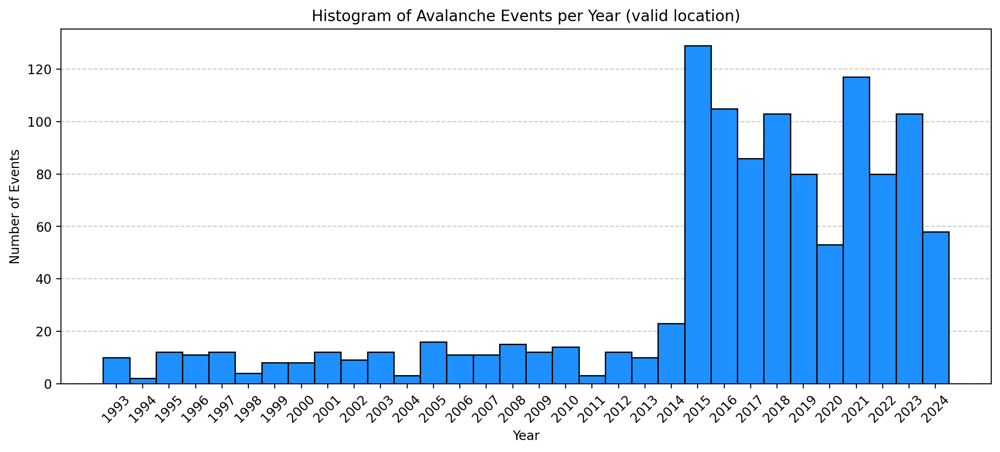

In [56]:
bins = range(yearly_events.min(), yearly_events.max() + 2)
plot_histogram(data=yearly_events, title='Histogram of Avalanche Events per Year (valid location)', x_label='Year',
               y_label='Number of Events', bins=bins, x_ticks_labels=bins[:-1], figsize=(13, 5), rotation=45)
plt.show()

The distribution now seems much more even and realistic. It can now clearly be seen when the LAWIS system was widely adopted with different AWS (2015).

### Removing Incidents with Invalid Location

As the filtering of the data with invalid location records also removed the previously unexplainable spike in 2015, and since these two features are key for avalanche incident recording in general, records with invalid location will be entirely removed from the dataset. A possible explanation could be that a data import was performed around 2015, but as all those events are not recorded on the same day and don't show any noticeable pattern, it is hard to state with certainty.

In [57]:
incidents = incidents.drop(filtered_groups.index)

### Filling the Missing Values
Aside from elevation and slope, there are no missing values in the location part of the dataset. Any missing values in these columns can be calculated using a Digital Elevation Model (DEM).


Local Austrian governments make publicly available a wide variety of geographical data about their administrative territory in the form of open data. The government of the Tyrol federal state publishes both DEM (bare-Earth surface representation) and DSM (Digital Surface Model - includes both natural and artificial features) datasets in a 5-meter resolution. These datasets can be downloaded [here](https://www.data.gv.at/katalog/dataset/0454f5f3-1d8c-464e-847d-541901eb021a). For our purposes, a DEM is more suitable, and its 2020 version is included in the `assets/geo_models/elevation_tirol.tif` file.


In [58]:
elevation_file, aspect_file, slope_file = 'assets/geo_models/elevation_tirol.tif', 'assets/geo_models/aspect_tirol.tif', 'assets/geo_models/slope_tirol.tif'
dem = ElevationModel(elevation_file=elevation_file,
                     aspect_file=aspect_file, slope_file=slope_file)

Creating the aspect model.
Aspect model successfully saved to file assets/geo_models/aspect_tirol.tif
Creating the slope model.
Slope model successfully saved to file assets/geo_models/slope_tirol.tif


The aspect and slope model have already been precalculated, but can simply be recalculated either by specifying a new file location or omitting the respective parameter.

#### DEM Visualization
Here we will visualize the resulting computed models, which will later be used for retrieving corresponding values. It is important to visualize them, as they provide an overview of the values we can expect.

**Note:** You can uncomment the cells and run the plotting yourself, but beware, as it is very resource-intensive (especially memory).

**Note 2:** Unfortunately GitHub doesn't render these images right, you can find them in the `plots` folder as well. You can also view them locally in your own Jupyter instance, there they will get rendered correctly.

##### Elevation Model
It can be seen that the elevation gets higher going southwards, with the highest altitudes being on the border with Italy and also in the northern parts of Osttirol.

<img src="assets/images/elevation_tirol_colorbar.png" alt="Elevation Plot" width="1100" />

In [59]:
# plot_dem(elevation_file, cmap='terrain',colorbar='Altitude (m)', title='Elevation')

##### Slope Aspect Model
The predominant color in the plot is green, suggesting that the most usual slope aspect is southeast.

<img src="assets/images/aspect_tirol_colorbar.png" alt="Slope Aspect Plot" width="1100" />

In [60]:
# plot_dem(aspect_file, cmap='hsv' ,colorbar='Azimuth (degrees)', title='Slope Aspects')

##### Slope Angle Model
The most common slope angles for ski touring are between 30 and 45 degrees [[source](https://avalanche.ca/glossary/terms/slope-angle)]. This suggests that Tirol has ideal slope conditions for ski touring, especially in the areas south of the Inn valley.


<img src="assets/images/slope_tirol_colorbar.png" alt="Slope Angle Plot" width="1100"/>

In [61]:
# plot_dem(slope_file, cmap='viridis', colorbar='Angle (degrees)', title='Slope Inclination')

In [62]:
missing_data_overview(incidents.filter(regex='^location'))

,Non-Null Values (%),Unique Values,Non-Null Values
Feature Name,,,
location_longitude,100.000000,1138,1144
location_latitude,100.000000,1136,1144
location_name,100.000000,893,1144
location_subregion_text,100.000000,38,1144
location_elevation,91.958042,233,1052
location_aspect_text,91.695804,8,1049
location_slope_angle,83.566434,27,956


### Incident Elevation

In [63]:
elevation_data = incidents['location_elevation'].dropna()

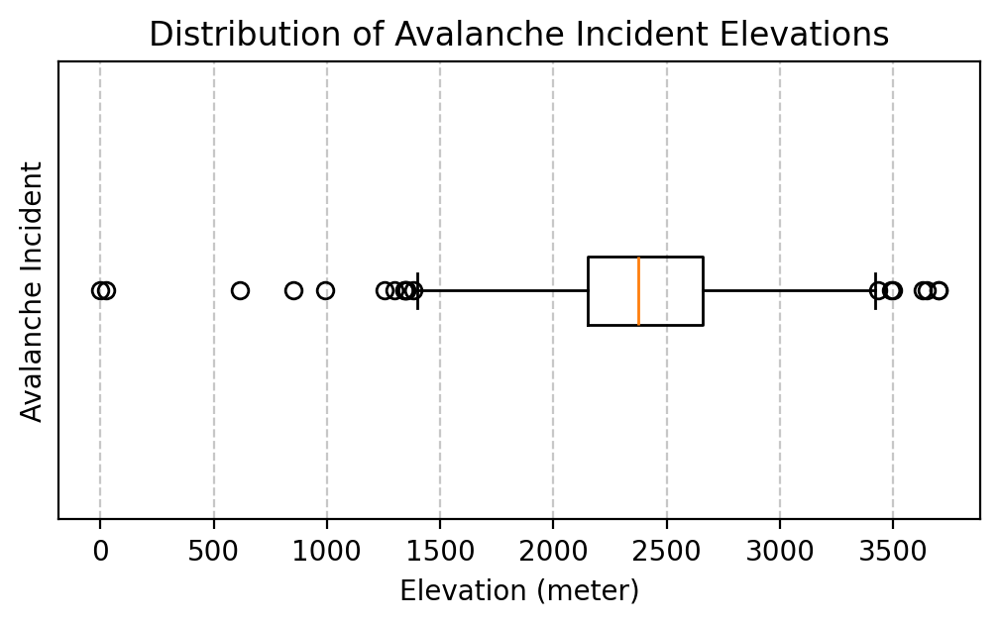

count    1052.000000
mean     2404.648289
std       435.269823
min         0.000000
25%      2150.000000
50%      2375.000000
75%      2660.000000
max      3700.000000
Name: location_elevation, dtype: float64

In [64]:
plot_boxplot(data=elevation_data, title='Distribution of Avalanche Incident Elevations', x_label='Elevation (meter)',
             y_label='Avalanche Incident', figsize=(6, 3))
plt.show()
elevation_data.describe()

There is a high number of outliers. Additionally, the minimal elevation value seems quite suspicious, as the lowest point in Tyrol is supposed to be around 475 meters above sea level [[source](https://www.tt.com/artikel/4587399/die-rekordjaeger-tirols)], and there should not be any records with elevations below that value.

Let's compare the recorded elevations with the computed data from the DEM.

In [65]:
incidents['calculated_elevation'] = incidents.apply(
    lambda row: round(dem.get_elevation(row['location_longitude'], row['location_latitude'])), axis=1)
incidents['elevation_difference'] = abs(incidents['location_elevation'] - incidents['calculated_elevation'])

In [66]:
elevation_threshold = 300

In [67]:
incidents_big_elevation_difference = incidents[incidents['elevation_difference'] > elevation_threshold]

In [68]:
map_data = incidents_big_elevation_difference[['date','location_name', 'location_latitude', 'location_longitude', 'elevation_difference', 'location_elevation', 'calculated_elevation']]
plot_incident_map(data=map_data, lat_idx='location_latitude', lon_idx='location_longitude', popup_data=True, zoom=9)

In [69]:
print(f'Incidents with an elevation difference of more than {elevation_threshold} meters:')
incidents_big_elevation_difference[['elevation_difference', 'location_elevation', 'calculated_elevation']].sort_values(
    by='elevation_difference', ascending=False)

Incidents with an elevation difference of more than 300 meters:


,elevation_difference,location_elevation,calculated_elevation
670,2354.0,24.0,2378
2470,2193.0,0.0,2193
2535,1323.0,3288.0,1965
1629,1198.0,3200.0,2002
2997,1001.0,2035.0,3036
2007,925.0,1700.0,2625
2455,727.0,2800.0,2073
611,708.0,2290.0,2998
2296,708.0,2290.0,2998
3058,619.0,2260.0,1641


As there are significant differences between the actual (computed from the DEM) and recorded altitude for some incidents, it cannot be established if those records are valid. Furthermore, as the `location_name` sometimes mentions a completely different location from the recorded coordinates, it wouldn't be possible to validate other important factors such as slope angle and slope aspect. Therefore, incidents with an elevation difference of 300 meters or more will be removed from the dataset.

In [70]:
idx_to_drop = incidents_big_elevation_difference.index
print(f'Records to be dropped: {len(idx_to_drop)}')
incidents = incidents.drop(idx_to_drop)

Records to be dropped: 25


#### Filling the Missing Data
Let's continue by filling the missing data. This is the easiest feature to complete - elevation values are directly included in the downloaded model.

In [71]:
location_elevation_missing = incidents['location_elevation'].describe()

In [72]:
incidents['location_elevation'] = incidents['location_elevation'].fillna(incidents['calculated_elevation'])

In [73]:
compare_column_operation(location_elevation_missing, incidents.location_elevation.describe(),
                         f"Results of the missing data filling for the feature {location_elevation_missing.name}:")

Results of the missing data filling for the feature location_elevation:


,Before,After
count,1027.000000,1119.000000
mean,2410.621227,2399.374441
std,422.755711,430.412661
min,615.000000,615.000000
25%,2150.000000,2132.500000
50%,2380.000000,2360.000000
75%,2660.000000,2650.000000
max,3700.000000,3700.000000


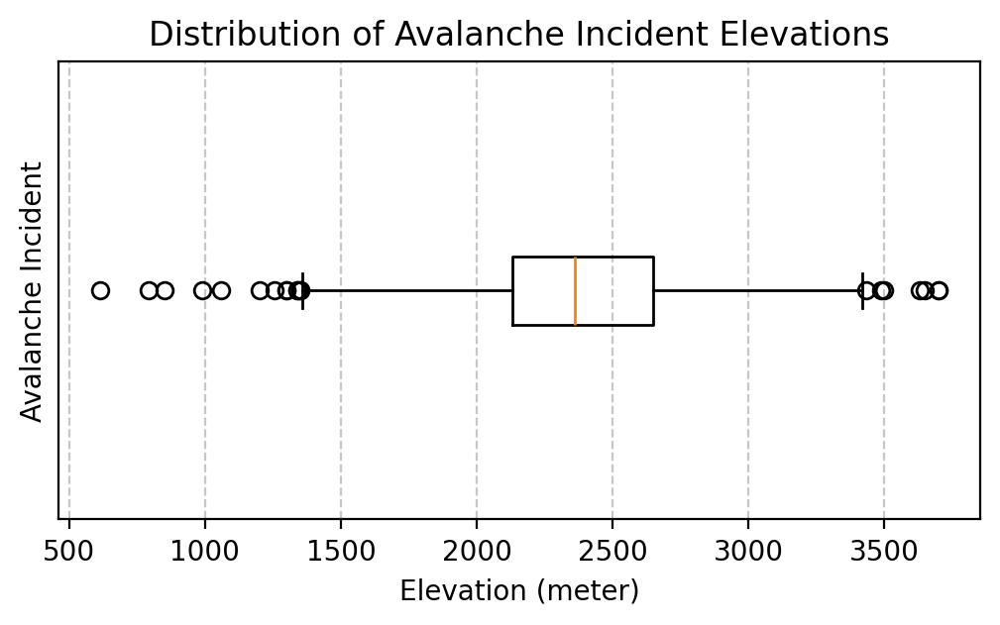

In [74]:
plot_boxplot(incidents['location_elevation'].dropna(), title='Distribution of Avalanche Incident Elevations',
             x_label='Elevation (meter)',
             y_label='Avalanche Incident', figsize=(6, 3))
plt.show()

The filling slightly increased the standard deviation of the feature. The mean shifted to lower value while the 75th quantile remained approximately the same as well as the 25th quantile. Without creating a lot of new outliers we managed to fill 92 missing elevation values.

### Slope
Slope is the geographical feature that had the most values missing. Let's have a look on its distribution.

In [75]:
slope_data = incidents['location_slope_angle'].copy()

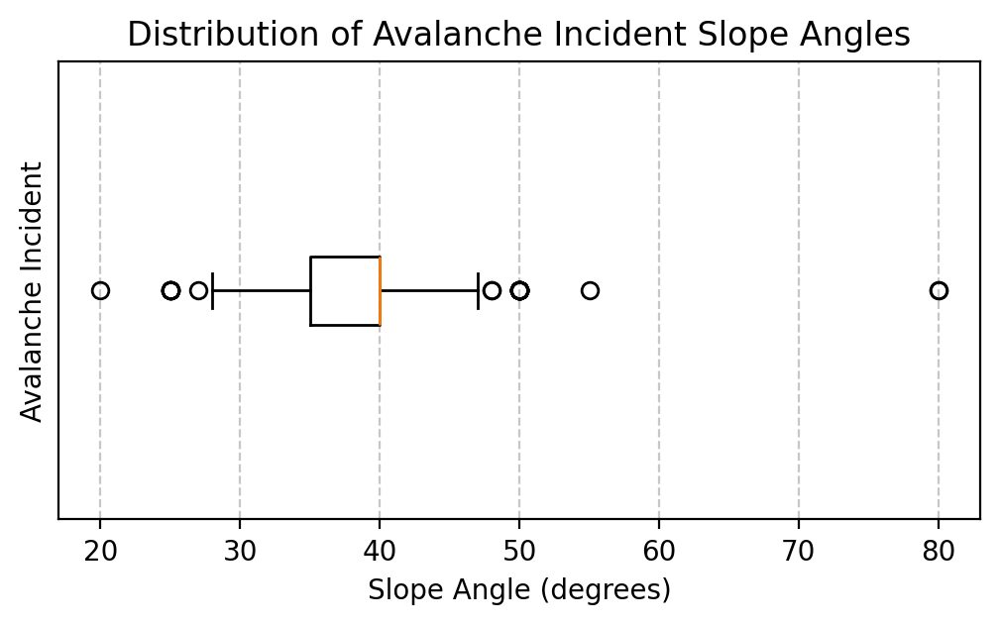

count    934.000000
mean      38.266595
std        4.634626
min       20.000000
25%       35.000000
50%       40.000000
75%       40.000000
max       80.000000
Name: location_slope_angle, dtype: float64

In [76]:
plot_boxplot(data=slope_data.dropna(), title='Distribution of Avalanche Incident Slope Angles',
             x_label='Slope Angle (degrees)',
             y_label='Avalanche Incident', figsize=(6, 3))
plt.show()
incidents['location_slope_angle'].describe()

There are also some suspicious values, let's see if we can compare them with the values computed from the DEM Model.

In [77]:
incidents['calculated_slope'] = incidents.apply(
    lambda row: round(dem.get_slope(row['location_longitude'], row['location_latitude'])), axis=1)
incidents['slope_difference'] = abs(incidents['location_slope_angle'] - incidents['calculated_slope'])

In [78]:
incidents_big_angle_difference = incidents[incidents['slope_difference'] > 40]

In [79]:
incidents_big_angle_difference[['location_slope_angle', 'slope_difference', 'elevation_difference']].sort_values(
    by='slope_difference', ascending=False)

,location_slope_angle,slope_difference,elevation_difference
575,80.0,69.0,41.0
709,35.0,41.0,9.0


We can see that there are plenty of suspicious values (records) where the difference between calculated and recorded slope angle is significant. However, determining the validity of the slope angle values is much more challenging. Even a slight inaccuracy in the recorded location can result in a substantial difference in slope angle. Additionally, changes in the snowpack can alter the character of the slope and consequently affect the slope angle. Therefore, it was decided to only remove records with a high difference (over 40 degrees). This decision was made because the slope angle could serve as another indicator that those records are misplaced.

In [80]:
map_data = incidents_big_angle_difference[['date','location_name', 'location_latitude', 'location_longitude', 'slope_difference', 'location_slope_angle', 'calculated_slope', 'elevation_difference']]
plot_incident_map(data=map_data, lat_idx='location_latitude', lon_idx='location_longitude', popup_data=True, zoom=9)

In [81]:
idx_to_drop = incidents_big_angle_difference.index
print(f'Records to be dropped: {len(idx_to_drop)}')
incidents = incidents.drop(idx_to_drop)

Records to be dropped: 2


#### Filling the Missing Data

In [82]:
location_slope_missing = incidents['location_slope_angle'].describe()

In [83]:
incidents['location_slope_angle'] = incidents['location_slope_angle'].fillna(incidents['calculated_slope'])

In [84]:
compare_column_operation(location_slope_missing, incidents['location_slope_angle'].describe(),
                         f"Results of the missing data filling for the feature {location_elevation_missing.name}:")

Results of the missing data filling for the feature location_elevation:


,Before,After
count,932.000000,1117.000000
mean,38.225322,37.307968
std,4.431927,6.822642
min,20.000000,2.000000
25%,35.000000,35.000000
50%,40.000000,38.000000
75%,40.000000,40.000000
max,80.000000,80.000000


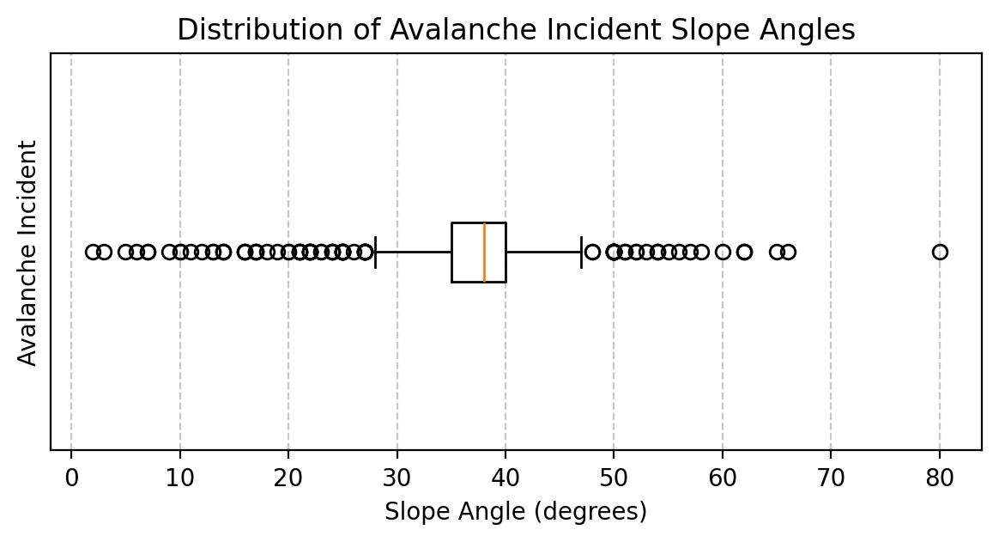

In [85]:
plot_boxplot(data=incidents['location_slope_angle'].dropna(), title='Distribution of Avalanche Incident Slope Angles',
             x_label='Slope Angle (degrees)',
             y_label='Avalanche Incident', figsize=(7, 3))
plt.show()

The filling introduced a new elevation minimum at 2 degrees and increased the standard deviation of the feature. The mean shifted to a lower value, while the 75th and 25th quantiles remained approximately the same. Unfortunately, it also created some new outliers. I decided to remove all events with a slope angle below 10 degrees (except for those with a danger rating of 4 and 5), as it shouldn't normally be possible to trigger an avalanche on such terrain (except under very extreme conditions).

In [86]:
slope_outliers = incidents.loc[iqr_outlier_detection(incidents['location_slope_angle']).index]
slope_outliers

,id,date,valid_time,location_longitude,location_latitude,danger_rating_level,danger_rating_text,danger_problem_text,involved_sum,involved_dead,involved_injured,involved_uninjured,involved_swept,involved_buried_total,involved_buried_partial,involved_not_buried,avalanche_extent_length,avalanche_extent_width,avalanche_breakheight,avalanche_type_text,avalanche_size_text,location_elevation,location_slope_angle,location_aspect_text,location_name,location_subregion_text,involved_equipment_standard_text,involved_equipment_lvs_text,involved_equipment_airbag_text,involved_ascent_descent_text,avalanche_release_text,avalanche_humidity_text,weather_temp,weather_snow_depth,weather_temp_mean,weather_temp_diff,weather_rain_sum,weather_snow_sum,weather_wind_speed_mean,weather_wind_dir_mean,weather_radiation_sum,decimal_time,week_day,rounded_longitude,rounded_latitude,calculated_elevation,elevation_difference,calculated_slope,slope_difference
1,9355,2018-02-17 12:42:00,True,10.51200,47.04033,3.0,3.0,NaN,2.0,0.0,0.0,2.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,slab,NaN,3001.0,22.0,NaN,Furglerscharte,Samnaungruppe,NaN,NaN,NaN,NaN,NaN,NaN,-5.520000,1.73,-13.941355,11.135417,0.1,11.830001,2.170215,239.169565,27.330000,12.700000,5,10.5120,47.0403,3001,NaN,22,NaN
7,9348,2018-02-16 11:20:00,True,12.14483,47.30417,3.0,3.0,NaN,2.0,0.0,0.0,2.0,2.0,0.0,0.0,NaN,NaN,NaN,NaN,slab,NaN,1834.0,19.0,NaN,Schwebekopf,Westl. Kitzbüheler Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-2.266500,1.58,-9.566500,9.116668,0.4,13.510000,1.801052,232.647991,29.210001,11.333333,4,12.1448,47.3042,1834,NaN,19,NaN
9,9382,2018-02-24 00:00:00,False,12.11602,47.31589,2.0,2.0,NaN,1.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,slab,NaN,2400.0,52.0,NW,Schafsieder,Westl. Kitzbüheler Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-13.165001,4.19,-13.371251,0.645834,0.0,4.130000,2.180376,51.051593,36.270000,0.000000,5,12.1160,47.3159,2400,NaN,52,NaN
14,9391,2018-03-02 20:28:00,True,10.31600,47.06317,3.0,3.0,NaN,1.0,0.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,slab,NaN,2298.0,24.0,NaN,Niederelbehütte,Östl. Verwallgruppe,NaN,NaN,NaN,NaN,NaN,NaN,-8.391000,1.97,-16.280584,16.297918,0.1,4.410000,2.297772,155.377747,50.530000,20.466667,4,10.3160,47.0632,2298,NaN,24,NaN
17,9399,2018-03-08 11:18:00,True,12.41901,47.42061,2.0,2.0,NaN,0.0,0.0,0.0,0.0,0.0,1.0,0.0,NaN,NaN,NaN,NaN,slab,NaN,791.0,5.0,NaN,Hörndlinger Graben,Westl. Kitzbüheler Alpen,NaN,NaN,NaN,NaN,NaN,NaN,6.548000,1.32,3.034979,-2.347918,2.6,3.710000,2.194196,186.254150,41.160000,11.300000,3,12.4190,47.4206,791,NaN,5,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3014,10786,2024-01-14 11:00:00,True,11.09430,47.00886,2.0,2.0,wind_slab,5.0,0.0,0.0,5.0,3.0,0.0,1.0,2.0,50.0,NaN,40.0,slab,1: small avalanche,3000.0,27.0,E,Hinterer Daunkopf,Zentrale Stubaier Alpen,yes,yes,some,ascent,artificial,NaN,-12.284500,1.58,-15.555855,-5.268751,0.0,0.280000,4.039983,320.398764,32.050000,11.000000,6,11.0943,47.0089,2981,19.0,27,NaN
3032,10827,2024-01-27 14:35:00,True,10.71133,46.86250,2.0,2.0,NaN,1.0,0.0,0.0,1.0,1.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,2750.0,3.0,NaN,Karlesjochbahn Talstation,Glockturmgruppe,NaN,NaN,NaN,NaN,NaN,NaN,-8.731500,33.33,-5.884105,-8.004168,4.5,14.980000,4.981157,308.707584,25.590000,14.583333,5,10.7113,46.8625,2754,4.0,3,NaN
3042,10861,2024-02-24 11:57:00,True,11.78867,47.18050,3.0,3.0,new_snow,NaN,NaN,1.0,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,slab,NaN,1775.0,22.0,NaN,Wanglspitze,Östl. Tuxer Alpen,NaN,NaN,NaN,NaN,NaN,dry,-0.801500,1.53,-2.690041,-4.937500,0.1,28.770000,2.244769,216.938160,34.180000,11.950000,5,11.7887,47.1805,1775,NaN,22,NaN
3050,10868,2024-02-16 15:27:00,True,11.37904,47.31223,2.0,2.0,gliding_snow,2.0,0.0,0.0,2.0,1.0,0.0,0.0,1.0,100.0,20.0,NaN,NaN,2: medium avalanche,2350.0,50.0,S,Seegrubenspitze,Westliches Karwendel,NaN,NaN,NaN,ascent,artificial,NaN,4.741500,1.15,-3.379333,6.885417,0.2,0.350000,1.543343,309.259354,4

In [87]:
idx_to_drop = slope_outliers[
    (~slope_outliers['danger_rating_text'].isin([4, 5]) | slope_outliers['danger_rating_text'].isnull()) &
    (slope_outliers['location_slope_angle'] <= 10)].index
print(f'Records to be dropped: {len(idx_to_drop)}')
incidents = incidents.drop(idx_to_drop)

Records to be dropped: 8


#### Feature Distribution

In [88]:
slope_angles = incidents['location_slope_angle']

Angle distribution for incidents binned by 5 degrees:



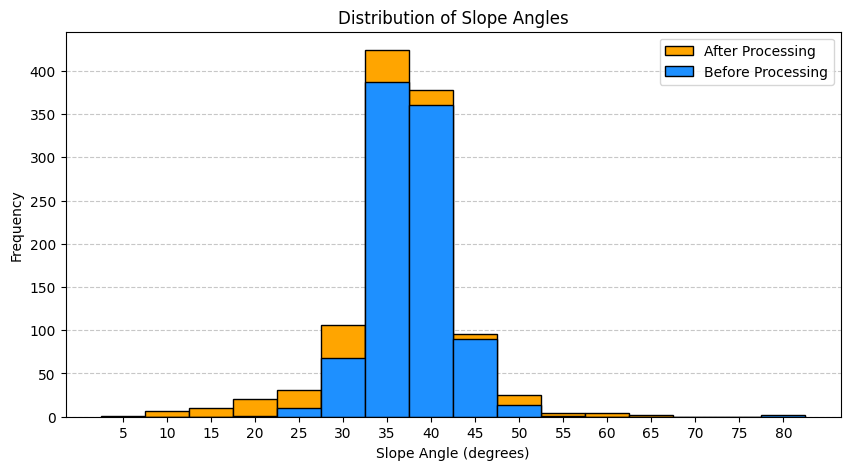

In [89]:
bins = range(5, 86, 5)
fig, ax = plt.subplots(figsize=(10, 5))
plot_histogram(data=slope_angles, x_label='Slope Angle (degrees)',
               y_label='Frequency', bins=bins, x_ticks_labels=bins[:-1], ax=ax, color='orange',
               label='After Processing')
plot_histogram(data=slope_data, x_label='Slope Angle (degrees)',
               y_label='Frequency', bins=bins, x_ticks_labels=bins[:-1], ax=ax, label='Before Processing')
ax.legend()
ax.set_title('Distribution of Slope Angles')
print("Angle distribution for incidents binned by 5 degrees:\n")

plt.show()

In [90]:
print("Angle distribution for incidents binned by 5 degrees:\n")
pd.cut(slope_angles, bins, right=False, include_lowest=True).value_counts().sort_index()[lambda x: x > 0]

Angle distribution for incidents binned by 5 degrees:



location_slope_angle
[5, 10)       1
[10, 15)      7
[15, 20)     10
[20, 25)     20
[25, 30)     31
[30, 35)    106
[35, 40)    424
[40, 45)    378
[45, 50)     96
[50, 55)     25
[55, 60)      4
[60, 65)      4
[65, 70)      2
[80, 85)      1
Name: count, dtype: int64

### Slope Aspect
#### Filling the Missing Data

In [91]:
aspects_before_filling = incidents['location_aspect_text'].copy()

In [92]:
missing_aspects_counts = unique_value_counts(incidents['location_aspect_text'], 'Slope Aspect')
missing_aspects_counts

Unique values for the property "Slope Aspect" (8 unique values and 1021 / 1109 non-null values):



location_aspect_text
NE    233
N     189
E     146
NW    135
SE    123
W      75
S      68
SW     52
Name: count, dtype: int64

As this feature only contains the 8 basic cardinal directions and not precise azimuth values, the missing values will be replaced with the same categories.

In [93]:
incidents['calculated_aspect'] = incidents.apply(
    lambda row: degrees_to_text(dem.get_aspect(lon=row['location_longitude'], lat=row['location_latitude'])), axis=1)

In [94]:
missing_aspect_counts = unique_value_counts(incidents['location_aspect_text'], description=False)

In [95]:
incidents['location_aspect_text'] = incidents['location_aspect_text'].fillna(incidents['calculated_aspect'])

In [96]:
compare_column_operation(missing_aspects_counts,
                         unique_value_counts(incidents['location_aspect_text'], description=False),
                         f"Results of the missing data filling for the feature {missing_aspects_counts.name} (number of occurrences per each value):")

Results of the missing data filling for the feature count (number of occurrences per each value):


,Before,After
location_aspect_text,,
NE,233,247
N,189,195
E,146,165
NW,135,148
SE,123,139
W,75,85
S,68,72
SW,52,58


In the case of slope aspect, it was decided not to compare the computed slope aspect because it depends mostly on the correct coordinate records, and it can change completely just by pointing to the other side of a ridge. Furthermore, the values are not measured precisely but categorized into 8 cardinal directions, which impedes precise comparison with the computed azimuth values.

In [97]:
directions = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW']
aspect_counts_before = aspects_before_filling.value_counts()
directions_dict_before = {direction: aspect_counts_before.get(direction, 0) for direction in directions}

aspect_counts_after = incidents['location_aspect_text'].value_counts()
directions_dict_after = {direction: aspect_counts_after.get(direction, 0) for direction in directions}

[[50, 100, 150, 200, 250], [50, 100, 150, 200, '']]


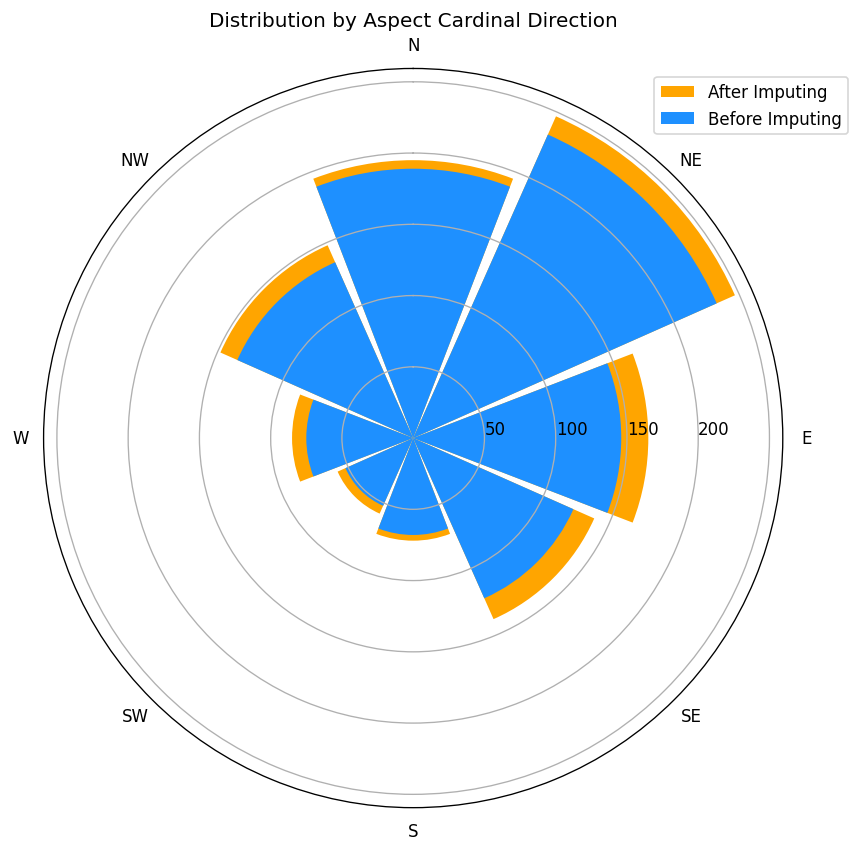

In [98]:
fig, ax = plt.subplots(figsize=(8, 8), dpi=120, subplot_kw={'projection': 'polar'})
y_ticks = [list(range(50, 251, 50)), list(range(50, 251, 50))]
y_ticks[1][-1] = ''  # preventing matplotlib from plotting the last tick label
print(y_ticks)
plot_polar_bar(directions_dict_after, 'Incidents by Cardinal Directions', x_ticks=directions_dict_after.keys(),
               color='orange', label='After Imputing', ax=ax)
plot_polar_bar(directions_dict_before, 'Incidents by Cardinal Directions', x_ticks=directions_dict_before.keys(), ax=ax,
               label='Before Imputing', y_ticks=y_ticks)
ax.legend(bbox_to_anchor=(1.1, 1))
ax.set_title('Distribution by Aspect Cardinal Direction')
plt.show()


The majority of the recorded avalanche incidents occurred on the slopes that face the north direction. The highest number of incidents being on the northwest slopes, followed by north and northeast facing slopes.
The data corresponds with the already established information about the importance of slope aspect in the formation of a possible avalanche. In the northern hemisphere, north and east aspects tend to be colder and windier than the south and west aspects and thus are more likely to hold more snowpack and, in consequence, also more unstable layers. [[source](https://avalanche.org/avalanche-encyclopedia/terrain/slope-characteristics/aspect/)], [[source](https://avalanche.ca/glossary/terms/aspect)] The resulting windrose diagram closely resembles the Avalanche Aspect Heatmap provided by the Utah Avalanche Center. [[source]( https://utahavalanchecenter.org/tools/avyheatmap/)]



## Avalanche Characteristics
* Examined features: `avalanche_release_text`, `avalanche_type_text`, `avalanche_extent_length`,`avalanche_extent_width`, `avalanche_breakheight`, `avalanche_size_text`, `avalanche_humidity_text`

In [99]:
missing_data_overview(data=incidents.filter(regex='^avalanche'), threshold=101, missing_cols_idx=False)

,Non-Null Values (%),Unique Values,Non-Null Values
Feature Name,,,
avalanche_type_text,90.171326,3,1000
avalanche_extent_length,73.669973,85,817
avalanche_extent_width,72.317403,58,802
avalanche_size_text,62.669071,5,695
avalanche_breakheight,57.709648,43,640
avalanche_release_text,43.552750,2,483
avalanche_humidity_text,41.298467,2,458


### Avalanche Release

In [100]:
display(unique_value_counts(incidents['avalanche_release_text'], 'Avalanche Release'))

Unique values for the property "Avalanche Release" (2 unique values and 483 / 1109 non-null values):



avalanche_release_text
artificial     451
spontaneous     32
Name: count, dtype: int64

As this feature only contains two values, for better clarity, we will map them to boolean values, indicating whether the recorded avalanche was artificial or not.

In [101]:
incidents = adjust_column(incidents, 'avalanche_release_text', {
    'artificial': True,
    'spontaneous': False
}, rename='avalanche_artificial_release')

### Avalanche Type

In [102]:
display(unique_value_counts(incidents['avalanche_type_text'], 'Avalanche Type'))

Unique values for the property "Avalanche Type" (3 unique values and 1000 / 1109 non-null values):



avalanche_type_text
slab       951
loose       27
gliding     22
Name: count, dtype: int64

The majority of incidents in the dataset involve slab avalanches. This is understandable considering that the dataset primarily comprises incidents reported by individuals, which are often triggered by human activity. Slab avalanches are the most common type overall and are frequently triggered by human interaction. Loose snow avalanches, on the other hand, tend to occur naturally, typically requiring specific environmental conditions such as recent snowfall or warming, along with very steep terrain. Additionally, gliding avalanches cannot be triggered by humans. [[source](https://www.slf.ch/de/lawinen/lawinenkunde-und-praevention/lawinenarten/)]

In [103]:
incidents.groupby(['avalanche_type_text', 'avalanche_artificial_release']).size().rename('Count')

avalanche_type_text  avalanche_artificial_release
gliding              False                             8
                     True                              1
loose                False                             5
                     True                             10
slab                 False                            15
                     True                            414
Name: Count, dtype: int64

With the limited number of records available, it's challenging to state with high certainty; however, generally, the data aligns with the characteristics mentioned in the article above.

### Slab Thickness
Slab thickness is represented by the `avalanche_breakheight` feature and it is measured in centimeters. It is the height of the slab at the avalanche breakpoint.

In [104]:
avalanche_breakheights = incidents['avalanche_breakheight'].dropna()
height_min, height_max = avalanche_breakheights.min(), avalanche_breakheights.max()

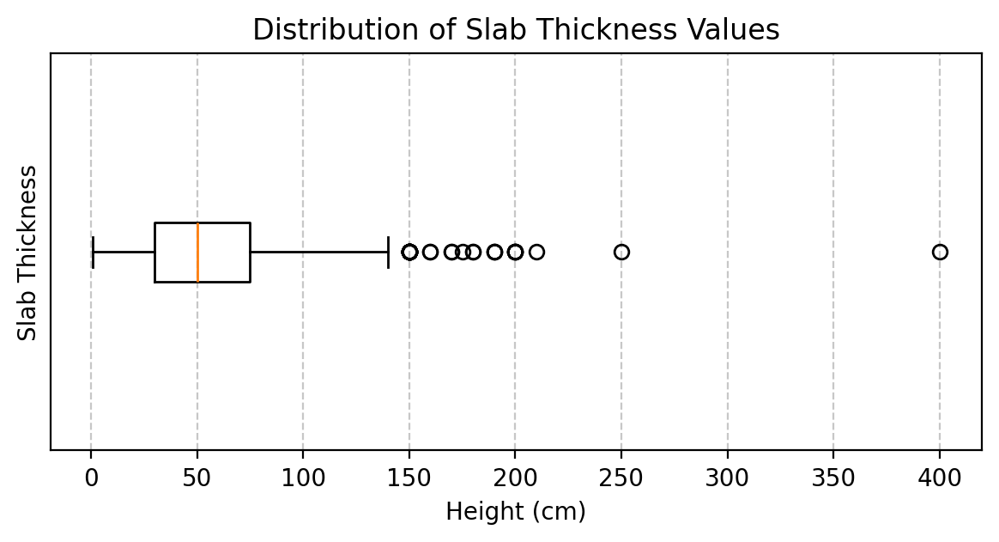

In [105]:
plot_boxplot(avalanche_breakheights, title='Distribution of Slab Thickness Values', x_label='Height (cm)',
             y_label='Slab Thickness')
plt.show()

In [106]:
print("Slab thickness distribution binned by 10 cm:\n")
pd.cut(avalanche_breakheights, range(0, int(height_max) + 1, 10), include_lowest=True).value_counts().sort_index()[
    lambda x: x > 0]

Slab thickness distribution binned by 10 cm:



avalanche_breakheight
(-0.001, 10.0]     15
(10.0, 20.0]       54
(20.0, 30.0]      100
(30.0, 40.0]      101
(40.0, 50.0]      123
(50.0, 60.0]       43
(60.0, 70.0]       38
(70.0, 80.0]       39
(80.0, 90.0]       14
(90.0, 100.0]      56
(100.0, 110.0]      8
(110.0, 120.0]      6
(120.0, 130.0]      4
(130.0, 140.0]      2
(140.0, 150.0]     19
(150.0, 160.0]      2
(160.0, 170.0]      2
(170.0, 180.0]      3
(180.0, 190.0]      3
(190.0, 200.0]      5
(200.0, 210.0]      1
(240.0, 250.0]      1
(390.0, 400.0]      1
Name: count, dtype: int64

In an ideal world, the modeled snow thickness should always be higher than the measured avalanche slab thickness. We can see how well the modeled data compares with the modeled data. 20 centimeters were chosen as a threshold for a big difference, as it is the typical slab thickness of a small avalanche according to [[source](https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2007JF000941)]. As the snow depth can vary during the day, only records with valid time were chosen.

In [107]:
incidents['thickness_difference'] = incidents['avalanche_breakheight'] - incidents['weather_snow_depth'] * 100

In [108]:
print('Incidents where the measured slab thickness is bigger than the modeled snow depth by at least 20 cm:')
incidents[
    (incidents['thickness_difference'] >= 20) & (incidents['valid_time'] == True)]

Incidents where the measured slab thickness is bigger than the modeled snow depth by at least 20 cm:


,id,date,valid_time,location_longitude,location_latitude,danger_rating_level,danger_rating_text,danger_problem_text,involved_sum,involved_dead,involved_injured,involved_uninjured,involved_swept,involved_buried_total,involved_buried_partial,involved_not_buried,avalanche_extent_length,avalanche_extent_width,avalanche_breakheight,avalanche_type_text,avalanche_size_text,location_elevation,location_slope_angle,location_aspect_text,location_name,location_subregion_text,involved_equipment_standard_text,involved_equipment_lvs_text,involved_equipment_airbag_text,involved_ascent_descent_text,avalanche_artificial_release,avalanche_humidity_text,weather_temp,weather_snow_depth,weather_temp_mean,weather_temp_diff,weather_rain_sum,weather_snow_sum,weather_wind_speed_mean,weather_wind_dir_mean,weather_radiation_sum,decimal_time,week_day,rounded_longitude,rounded_latitude,calculated_elevation,elevation_difference,calculated_slope,slope_difference,calculated_aspect,thickness_difference
604,270,2016-01-15 10:30:00,True,11.51456,47.16693,3.0,3.0,NaN,2.0,0.0,0.0,2.0,1.0,0.0,0.0,NaN,25.0,30.0,80.0,slab,2: medium avalanche,2300.0,38.0,N,Pfons,Westl. Tuxer Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-11.7380,0.57,-13.348939,-4.695834,0.0,5.460000,1.885226,259.975988,21.330000,10.500000,4,11.5146,47.1669,2301,1.0,36,2.0,NW,23.0
616,304,2016-01-29 15:00:00,True,10.47744,47.00635,3.0,3.0,NaN,1.0,0.0,1.0,0.0,1.0,0.0,0.0,NaN,180.0,50.0,125.0,slab,2: medium avalanche,2760.0,38.0,E,Minderskopf,Samnaungruppe,NaN,NaN,NaN,NaN,NaN,NaN,-2.4935,0.82,-7.346104,-0.960416,0.0,0.000000,1.340828,289.991063,32.360000,15.000000,4,10.4774,47.0064,2764,4.0,46,8.0,E,43.0
620,310,2016-02-06 10:55:00,True,11.74969,47.25060,3.0,3.0,NaN,3.0,0.0,0.0,3.0,0.0,0.0,1.0,NaN,400.0,250.0,150.0,slab,3: large avalanche,2200.0,45.0,E,Pfaffenbichl-Metzen,Östl. Tuxer Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-7.6145,0.73,-8.448875,-1.445834,0.0,17.710000,2.722523,353.801559,28.080000,10.916667,5,11.7497,47.2506,2177,23.0,43,2.0,NE,77.0
746,520,2015-04-12 11:00:00,True,11.33394,47.00000,3.0,3.0,NaN,2.0,1.0,0.0,1.0,0.0,2.0,0.0,NaN,1000.0,170.0,250.0,slab,4: very large avalanche,2300.0,40.0,E,Gargglerin,Zentrale Stubaier Alpen,yes,yes,none,descent,NaN,wet,7.3985,1.48,2.433917,1.010416,2.3,1.330000,1.404323,250.163246,92.410000,11.000000,6,11.3339,47.0000,2023,277.0,20,20.0,E,102.0
2368,9108,2016-10-16 14:13:00,True,11.65711,47.05421,NaN,NaN,NaN,2.0,1.0,1.0,0.0,0.0,2.0,0.0,NaN,180.0,40.0,35.0,slab,2: medium avalanche,3350.0,45.0,N,Olperer,Nördl. Zillertaler Alpen,NaN,NaN,NaN,NaN,NaN,NaN,3.3580,0.02,-5.295126,6.075002,16.6,0.350000,2.191009,166.529451,35.460000,14.216667,6,11.6571,47.0542,3330,20.0,22,23.0,NW,33.0
2369,9111,2016-11-26 12:40:00,True,11.07218,46.84172,NaN,NaN,NaN,10.0,2.0,2.0,6.0,4.0,1.0,3.0,NaN,1000.0,500.0,100.0,slab,4: very large avalanche,3100.0,43.0,NW,Granatenkogel - Ferwalljoch,Gurgler Gruppe,NaN,NaN,NaN,NaN,NaN,NaN,-1.8945,0.41,-2.900750,-1.422917,0.0,5.180000,1.930840,158.773758,17.060000,12.666667,5,11.0722,46.8417,2972,128.0,46,3.0,NW,59.0
2371,9115,2017-01-06 12:10:00,True,12.54614,47.43430,3.0,3.0,NaN,1.0,0.0,0.0,1.0,1.0,1.0,0.0,NaN,336.0,76.0,75.0,slab,2: medium avalanche,1800.0,37.0,NE,"Kleine Henne, Fieberbrunn",Östl. Kitzbüheler Alpen,NaN,NaN,NaN,NaN,NaN,NaN,-16.7475,0.36,-13.210522,-10.027083,0.0,23.310000,3.571241,294.844896,13.830000,12.166667,4,12.5461,47.4343,1781,19.0,39,2.0,NE,39.0
2407,9188,2017-03-07 13:01:00,True,12.54073,46.70342,3.0,3.0,NaN,3.0,0.0,2.0,1.0,3.0,0.0,3.0,NaN,380.0,180.0,100.0,slab,3: large avalanche,2200.0,42.0,N,Öfenspitze,Lienzer Dolomiten,NaN,NaN,NaN,NaN,NaN,NaN,-4.1715,0.77,-5.259520,-4.020832,0.0,17.360000,3.256442,221.734565,46.840000,13.016667,1,12.5407,46.7034,2148,52.0,39,3.0,N,23.0
2570,9778,2019-11-09 12:00:00,True,10.93700,46.93523,NaN,0.0,NaN,2.0,2.0,0.0,0.0,2.0,2.0,0.0,NaN,300.0,100.0,75.0,slab,2: medium avalanche,2840.0,40.0,N,Rettenbachferner,Weißkugelgruppe,NaN,NaN,NaN,NaN,NaN,NaN,-9.9970,0.51,-8.675646,-2.856250,0.0,10.570002,2.080400,180.89656

We can see that there are some events where `avalanche_breakheight` is considerably higher. As expected, the modeled values are approximate, but it is actually not that bad, considering that a model with spatial resolution of 9 km was used [[source](https://open-meteo.com/en/docs/historical-weather-api#data-sources)].

### Avalanche Length

In [109]:
avalanche_lengths = incidents['avalanche_extent_length'].dropna()
length_max = avalanche_lengths.max()

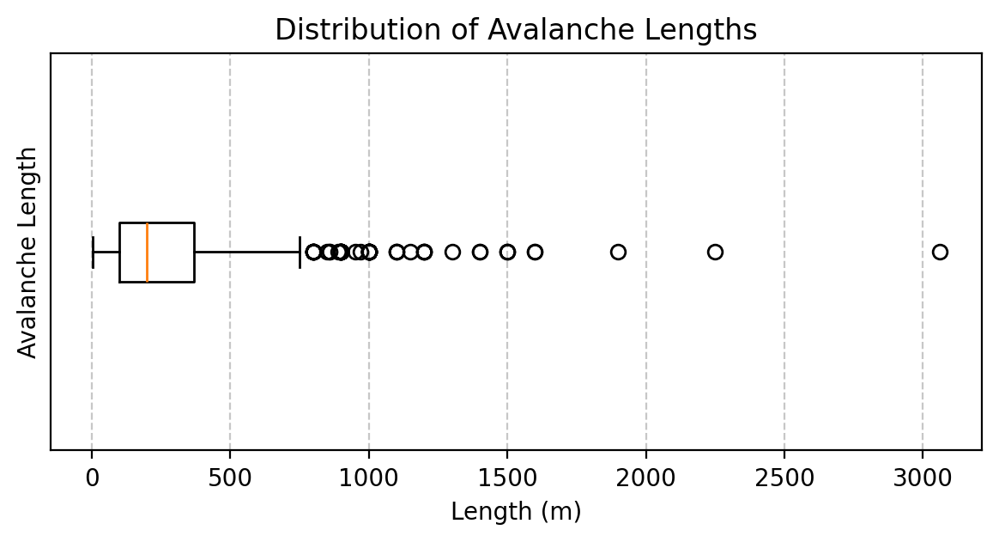

In [110]:
plot_boxplot(avalanche_lengths, title='Distribution of Avalanche Lengths', x_label='Length (m)',
             y_label='Avalanche Length')
plt.show()

### Avalanche Width

In [111]:
avalanche_widths = incidents['avalanche_extent_width'].dropna()

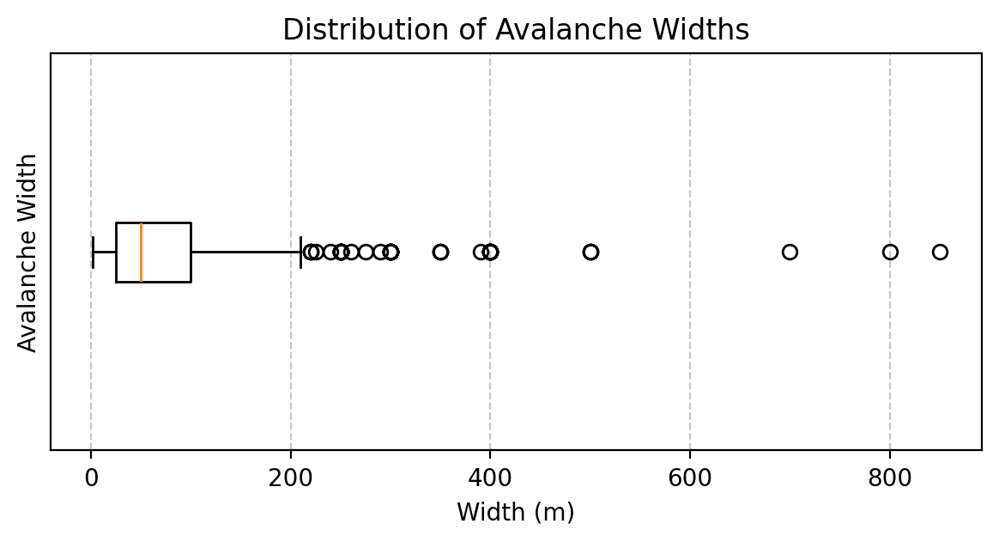

In [112]:
plot_boxplot(avalanche_widths, title='Distribution of Avalanche Widths', x_label='Width (m)', y_label='Avalanche Width')
plt.show()

### Avalanche Size


In [113]:
avalanche_sizes = incidents['avalanche_size_text']
unique_value_counts(avalanche_sizes, 'avalanche size')

Unique values for the property "avalanche size" (5 unique values and 695 / 1109 non-null values):



avalanche_size_text
2: medium avalanche             443
3: large avalanche              132
1: small avalanche               93
4: very large avalanche          26
5: extremely large avalanche      1
Name: count, dtype: int64

This column contains avalanche sizes classified by the EAWS grading system. The descriptions accompanying each size grade appear redundant and can therefore be removed.

In [114]:
incidents['avalanche_size_text'] = pd.to_numeric(incidents['avalanche_size_text'].str.split(':').str[0],
                                                 errors='coerce')

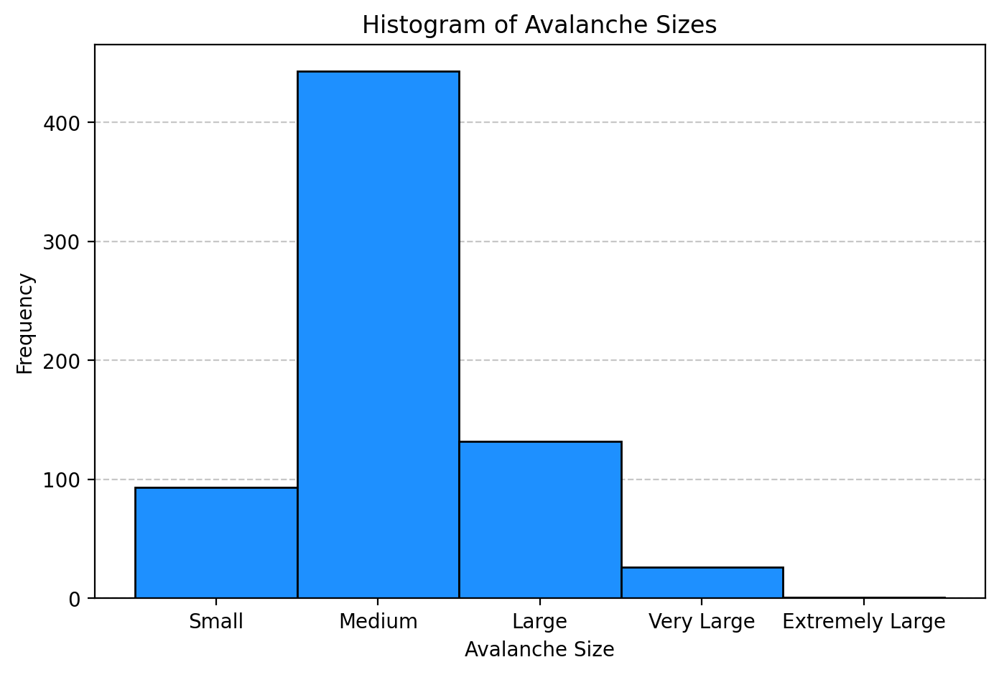

In [115]:
plot_histogram(data=incidents['avalanche_size_text'], title='Histogram of Avalanche Sizes', x_label='Avalanche Size',
               y_label='Frequency', bins=range(1, 7),
               x_ticks_labels=['Small', 'Medium', 'Large', 'Very Large', 'Extremely Large'])
plt.show()

### Correlation between Avalanche Size and Size Features

In [116]:
correlated_features = incidents[
    ['avalanche_breakheight', 'avalanche_extent_width', 'avalanche_extent_length', 'avalanche_size_text']]

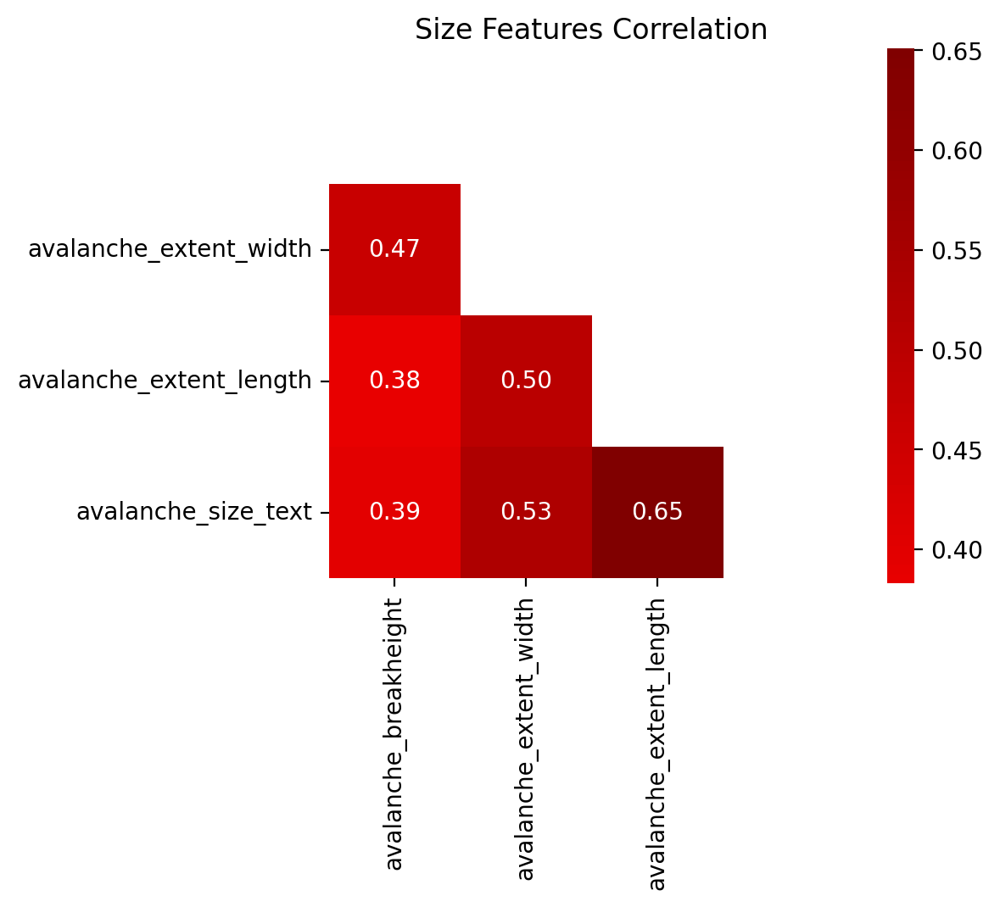

In [117]:
fig, ax = plot_heatmap(correlated_features.corr(method='spearman'), trimask=True, figsize=(5, 5),
                       color='seismic',
                       center=0, title='Size Features Correlation')
plt.show()

We can observe that avalanche size is most strongly correlated with its length, followed by width. Slab thickness (`avalanche_breakheight`) shows the least correlation. Avalanche sizes are primarily categorized by their length and volume. It's possible that the slab thickness is not as important because the avalanche can accumulate more mass independently of its original height due to factors such as slope and snowpack structure.


In [118]:
incidents.groupby('avalanche_size_text').agg({
    'avalanche_breakheight': ['mean'],
    'avalanche_extent_length': ['mean'],
    'avalanche_extent_width': ['mean']
})


,avalanche_breakheight,avalanche_extent_length,avalanche_extent_width
,mean,mean,mean
avalanche_size_text,,,
1.0,29.280000,62.285714,23.352113
2.0,52.498282,194.753463,58.571023
3.0,71.290698,488.221154,131.830189
4.0,93.888889,817.272727,269.772727
5.0,2.000000,1000.000000,300.000000


### Avalanche Humidity

In [119]:
display(unique_value_counts(incidents['avalanche_humidity_text'], 'Avalanche Humidity'))

Unique values for the property "Avalanche Humidity" (2 unique values and 458 / 1109 non-null values):



avalanche_humidity_text
dry    428
wet     30
Name: count, dtype: int64

As we already know, one of the danger problems mentioned is the wet snow, let's see how are the individual danger problems distributed in relation to the avalanche humidity.

In [120]:
incidents.groupby(['avalanche_humidity_text', 'danger_problem_text']).size().rename('Count')

avalanche_humidity_text  danger_problem_text   
dry                      gliding_snow                5
                         new_snow                   28
                         persistent_weak_layers    193
                         wind_slab                 175
wet                      gliding_snow                1
                         new_snow                    1
                         persistent_weak_layers      6
                         wet_snow                   13
                         wind_slab                   3
Name: Count, dtype: int64

In [121]:
incidents = adjust_column(incidents, 'avalanche_humidity_text', {'dry': False, 'wet': True})

As expected all the incidents with danger problem wet snow are indeed classified as wet avalanches. Interestingly, new snow and persistant weak layers are also mentioned, but they are not tipical for wet snowpack according to [[source](https://avalanche.report/education/avalanche-problems)].

## Human Involvement
* Examined features can be split into two categories: 
    * Counts of involved individuals in different states of involvement: `involved_sum`,`involved_dead`,`involved_injured`,`involved_uninjured`,`involved_swept`, `involved_buried_total`,`involved_buried_partial`,`involved_not_buried`
    * Categorical features: `involved_equipment_standard_text`,`involved_equipment_lvs_text`,`involved_equipment_airbag_text`,`involved_ascent_descent_text`

In [122]:
missing_data_overview(data=incidents.filter(regex='^involved'), threshold=101, missing_cols_idx=False)

,Non-Null Values (%),Unique Values,Non-Null Values
Feature Name,,,
involved_injured,88.007214,6,976
involved_dead,87.826871,10,974
involved_swept,87.466186,14,970
involved_buried_partial,87.015329,9,965
involved_buried_total,86.834986,10,963
involved_uninjured,69.612263,11,772
involved_sum,67.628494,14,750
involved_ascent_descent_text,36.429216,3,404
involved_equipment_standard_text,19.837692,2,220


In [123]:
involved_cols = incidents.filter(regex='^involved').select_dtypes(include=['number', 'bool'])
involved_cols.describe()

,involved_sum,involved_dead,involved_injured,involved_uninjured,involved_swept,involved_buried_total,involved_buried_partial,involved_not_buried
count,750.000000,974.000000,976.000000,772.000000,970.000000,963.000000,965.000000,192.000000
mean,1.865333,0.398357,0.260246,1.489637,1.288660,0.481828,0.458031,0.427083
std,1.762008,1.247170,0.605867,1.629382,2.533404,0.983456,0.935442,0.712562
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000
75%,3.000000,1.000000,0.000000,2.000000,2.000000,1.000000,1.000000,1.000000
max,15.000000,31.000000,6.000000,15.000000,60.000000,12.000000,10.000000,3.000000


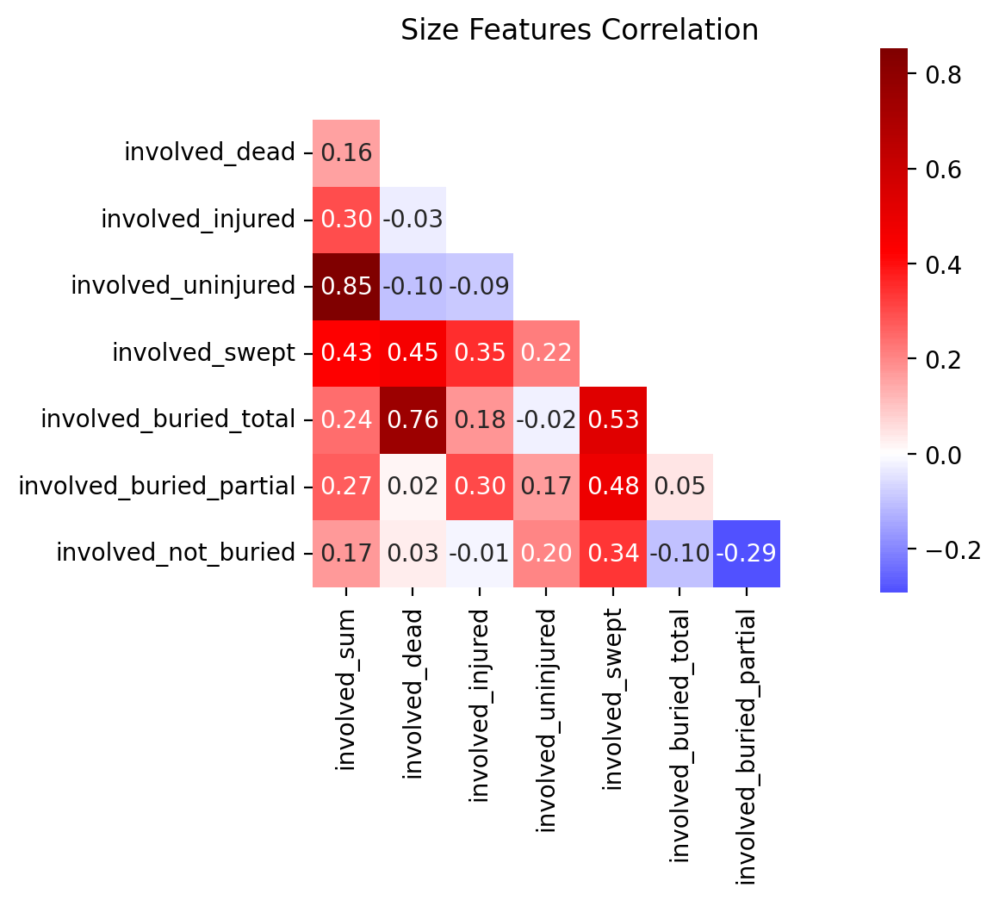

In [124]:
correlated_features = incidents.filter(regex='^involved').select_dtypes(include=['number'])
fig, ax = plot_heatmap(correlated_features.corr(method='spearman'), trimask=True, figsize=(5, 5),
                       color='seismic',
                       center=0, title='Size Features Correlation')
plt.show()

As the statistics confirm, ski touring groups are quite small, mostly consisting of 1 to 3 people (as per `involved_sum`). According to the correlation matrix, if individuals are completely buried (`involved_buried_total`), their chance of survival decreases, since they must be found before running out of oxygen to breathe.

### Involved Dead
Out of all the features, this feature has the lowest percent of missing values, and it makes sense as the deadly incidents get a lot of official attention and most of the time a proper investigation of the incident is initiated.

In [125]:
unique_value_counts(incidents['involved_dead'])

Unique values for the property "" (10 unique values and 974 / 1109 non-null values):



involved_dead
0.0     704
1.0     220
2.0      32
3.0       7
4.0       5
5.0       2
31.0      1
7.0       1
9.0       1
6.0       1
Name: count, dtype: int64

A vast majority of the incidents occur without any loss of human lives, but one event has an exceptionally high number of recorded fatalities:

In [126]:
incidents[incidents['involved_dead'] > 30]

,id,date,valid_time,location_longitude,location_latitude,danger_rating_level,danger_rating_text,danger_problem_text,involved_sum,involved_dead,involved_injured,involved_uninjured,involved_swept,involved_buried_total,involved_buried_partial,involved_not_buried,avalanche_extent_length,avalanche_extent_width,avalanche_breakheight,avalanche_type_text,avalanche_size_text,location_elevation,location_slope_angle,location_aspect_text,location_name,location_subregion_text,involved_equipment_standard_text,involved_equipment_lvs_text,involved_equipment_airbag_text,involved_ascent_descent_text,avalanche_artificial_release,avalanche_humidity_text,weather_temp,weather_snow_depth,weather_temp_mean,weather_temp_diff,weather_rain_sum,weather_snow_sum,weather_wind_speed_mean,weather_wind_dir_mean,weather_radiation_sum,decimal_time,week_day,rounded_longitude,rounded_latitude,calculated_elevation,elevation_difference,calculated_slope,slope_difference,calculated_aspect,thickness_difference
332,7012,1999-02-23,False,10.172831,46.982684,5.0,5.0,NaN,NaN,31.0,NaN,NaN,60.0,NaN,NaN,NaN,1400.0,400.0,NaN,slab,NaN,2700.0,40.0,SE,Galtür - Wasserleiterlawine - Weisse Riepe,Westl. Verwallgruppe,NaN,NaN,NaN,NaN,NaN,NaN,-17.212,2.66,-10.973458,-10.629164,0.1,34.719997,2.312138,282.276965,32.13,0.0,1,10.1728,46.9827,2700,0.0,49,9.0,SE,NaN


It is the 1999 Galtür avalanche. More information about this avalanche can be found [here](https://www.earthmagazine.org/article/benchmarks-february-23-24-1999-alpine-avalanches-sweep-through-austrian-towns-killing/).

### Involved Injured

In [127]:
unique_value_counts(incidents['involved_injured'], title='Injured Individuals')

Unique values for the property "Injured Individuals" (6 unique values and 976 / 1109 non-null values):



involved_injured
0.0    783
1.0    147
2.0     37
3.0      5
4.0      3
6.0      1
Name: count, dtype: int64

### Involved Uninjured
Out of the three, this feature has the most missing values, as it is challenging to determine the exact number of individuals on the slope without prior knowledge of all the different groups that were on the slope at the time of the incident.

In [128]:
unique_value_counts(incidents['involved_uninjured'], title='Uninjured Individuals')

Unique values for the property "Uninjured Individuals" (11 unique values and 772 / 1109 non-null values):



involved_uninjured
1.0     255
0.0     230
2.0     134
3.0      73
4.0      38
5.0      21
6.0      11
7.0       5
8.0       3
11.0      1
15.0      1
Name: count, dtype: int64

### Involved Sum
Involved sum has the lowest number of non-empty values as it should be a mere sum of the dead, injured and uninjured.

In [129]:
computed_sum = incidents[['involved_injured', 'involved_dead', 'involved_uninjured']].sum(axis=1, min_count=3)
correct_sum = np.isclose(incidents['involved_sum'], computed_sum, equal_nan=True, rtol=0, atol=0)

In [130]:
incidents[~correct_sum]

,id,date,valid_time,location_longitude,location_latitude,danger_rating_level,danger_rating_text,danger_problem_text,involved_sum,involved_dead,involved_injured,involved_uninjured,involved_swept,involved_buried_total,involved_buried_partial,involved_not_buried,avalanche_extent_length,avalanche_extent_width,avalanche_breakheight,avalanche_type_text,avalanche_size_text,location_elevation,location_slope_angle,location_aspect_text,location_name,location_subregion_text,involved_equipment_standard_text,involved_equipment_lvs_text,involved_equipment_airbag_text,involved_ascent_descent_text,avalanche_artificial_release,avalanche_humidity_text,weather_temp,weather_snow_depth,weather_temp_mean,weather_temp_diff,weather_rain_sum,weather_snow_sum,weather_wind_speed_mean,weather_wind_dir_mean,weather_radiation_sum,decimal_time,week_day,rounded_longitude,rounded_latitude,calculated_elevation,elevation_difference,calculated_slope,slope_difference,calculated_aspect,thickness_difference


There is one event that has non-missing involved_sum, even though the `involved_uninjured` value is missing. But besides that all the recorded data seems plausible, so we will just fill the `involved_uninjured` field.

In [131]:
incidents.loc[~correct_sum, 'involved_uninjured'] = incidents[~correct_sum]['involved_sum']

### Involved Totally Buried

In [132]:
unique_value_counts(incidents['involved_buried_total'], title='Totally Buried Individuals')

Unique values for the property "Totally Buried Individuals" (10 unique values and 963 / 1109 non-null values):



involved_buried_total
0.0     649
1.0     233
2.0      55
3.0      10
4.0       8
6.0       3
5.0       2
9.0       1
12.0      1
10.0      1
Name: count, dtype: int64

### Involved Partially Buried

In [133]:
unique_value_counts(incidents['involved_buried_partial'], title='Partially Buried Individuals')

Unique values for the property "Partially Buried Individuals" (9 unique values and 965 / 1109 non-null values):



involved_buried_partial
0.0     678
1.0     206
2.0      41
3.0      21
4.0      14
5.0       2
8.0       1
10.0      1
7.0       1
Name: count, dtype: int64

### Involved Not Buried

In [134]:
unique_value_counts(incidents['involved_not_buried'], title='Not Buried Individuals')

Unique values for the property "Not Buried Individuals" (4 unique values and 192 / 1109 non-null values):



involved_not_buried
0.0    130
1.0     47
2.0     10
3.0      5
Name: count, dtype: int64

### Involved Swept

In [135]:
unique_value_counts(incidents['involved_swept'], title='Swept Individuals')

Unique values for the property "Swept Individuals" (14 unique values and 970 / 1109 non-null values):



involved_swept
1.0     396
0.0     323
2.0     145
3.0      43
4.0      26
6.0      11
5.0      10
7.0       6
13.0      4
8.0       2
60.0      1
19.0      1
15.0      1
11.0      1
Name: count, dtype: int64

In [136]:
incidents[incidents['involved_swept'] == 60]

,id,date,valid_time,location_longitude,location_latitude,danger_rating_level,danger_rating_text,danger_problem_text,involved_sum,involved_dead,involved_injured,involved_uninjured,involved_swept,involved_buried_total,involved_buried_partial,involved_not_buried,avalanche_extent_length,avalanche_extent_width,avalanche_breakheight,avalanche_type_text,avalanche_size_text,location_elevation,location_slope_angle,location_aspect_text,location_name,location_subregion_text,involved_equipment_standard_text,involved_equipment_lvs_text,involved_equipment_airbag_text,involved_ascent_descent_text,avalanche_artificial_release,avalanche_humidity_text,weather_temp,weather_snow_depth,weather_temp_mean,weather_temp_diff,weather_rain_sum,weather_snow_sum,weather_wind_speed_mean,weather_wind_dir_mean,weather_radiation_sum,decimal_time,week_day,rounded_longitude,rounded_latitude,calculated_elevation,elevation_difference,calculated_slope,slope_difference,calculated_aspect,thickness_difference
332,7012,1999-02-23,False,10.172831,46.982684,5.0,5.0,NaN,NaN,31.0,NaN,NaN,60.0,NaN,NaN,NaN,1400.0,400.0,NaN,slab,NaN,2700.0,40.0,SE,Galtür - Wasserleiterlawine - Weisse Riepe,Westl. Verwallgruppe,NaN,NaN,NaN,NaN,NaN,NaN,-17.212,2.66,-10.973458,-10.629164,0.1,34.719997,2.312138,282.276965,32.13,0.0,1,10.1728,46.9827,2700,0.0,49,9.0,SE,NaN


Once again, the 1999 Galtür incident stood out when comparing the counts of individuals that were swept by the avalanche.

### AVD Activated
This feature indicates whether any member of the alpinist group has activated the LVS (Lawinenverschüttetensuchgerät - Avalanche Victim Detector).

In [137]:
unique_value_counts(incidents['involved_equipment_lvs_text'], 'AVD Activated')

Unique values for the property "AVD Activated" (2 unique values and 200 / 1109 non-null values):



involved_equipment_lvs_text
yes    176
no      24
Name: count, dtype: int64

As evident, the feature currently only consists of string representations of boolean values. To enhance comprehensibility, we will convert it directly into the numerical representation of the bool values. Additionally, we will rename the feature to improve clarity.

In [138]:
incidents = adjust_column(incidents, 'involved_equipment_lvs_text', {
    'yes': True,
    'no': False
}, rename='involved_avd_activated')

### Standard Equipment
This feature describes if all the members of the involved group had the standard avalanche equipment (meaning avalanche victim detector, snow shovel and avalanche probe).

In [139]:
unique_value_counts(incidents['involved_equipment_standard_text'], 'Standard Equipment')

Unique values for the property "Standard Equipment" (2 unique values and 220 / 1109 non-null values):



involved_equipment_standard_text
yes    193
no      27
Name: count, dtype: int64

As in the previous case, the feature will be converted and renamed.

In [140]:
incidents = adjust_column(incidents, 'involved_equipment_standard_text', {
    'yes': True,
    'no': False
}, rename='involved_standard_equipment')

In [141]:
column_names = [column for column in incidents.columns if
                len(incidents[column].unique()) == 3 and incidents[column].isin([np.nan, 'yes', 'no']).all()]
print(f'There are not any other columns that could be converted in the same way. {len(column_names) == 0}.')

There are not any other columns that could be converted in the same way. True.


### Individuals with Airbag

In [142]:
unique_value_counts(incidents['involved_equipment_airbag_text'])

Unique values for the property "" (3 unique values and 168 / 1109 non-null values):



involved_equipment_airbag_text
none    68
all     65
some    35
Name: count, dtype: int64

### Part of the Tour Where the Incident Happened

In [143]:
unique_value_counts(incidents['involved_ascent_descent_text'])

Unique values for the property "" (3 unique values and 404 / 1109 non-null values):



involved_ascent_descent_text
descent       324
ascent         76
not Moving      4
Name: count, dtype: int64

### Weather Conditions
| Weather Feature   | Description                                                              |
|-------------------|--------------------------------------------------------------------------|
| `temp`            | Air temperature at 2 meters above ground (°C)                            |
| `snow_depth`      | Snow depth (m)                                                           |
| `temp_mean`       | Average temperature (°C)                                                 |
| `temp_diff`       | Difference in average daily temperatures (°C)                            |
| `rain_sum`        | Total rainfall (mm)                                                      |
| `snow_sum`        | Total snowfall (cm)                                                      |
| `wind_speed_mean` | Average maximum wind speed without gusts at 10 meters above ground (m/s) |
| `wind_dir_mean`   | Dominant wind direction at 10 meters above ground (°)                    |
| `radiation_sum`   | Total solar radiation (MJ/m²)                                            |

In [144]:
weather_data = incidents.filter(regex='^weather')

In [145]:
data_overview(weather_data)

,Unique Values,Non-Null Values
weather_temp,1100,1109
weather_snow_depth,263,1109
weather_temp_mean,1094,1109
weather_temp_diff,1067,1109
weather_rain_sum,112,1109
weather_snow_sum,675,1109
weather_wind_speed_mean,1002,1109
weather_wind_dir_mean,1002,1109
weather_radiation_sum,936,1109


| Weather Feature   | Description                                                              |
|-------------------|--------------------------------------------------------------------------|
| `temp`            | Air temperature at 2 meters above ground (°C)                            |
| `snow_depth`      | Snow depth (m)                                                           |
| `temp_mean`       | Average temperature (°C)                                                 |
| `temp_diff`       | Difference in average daily temperatures (°C)                            |
| `rain_sum`        | Total rainfall (mm)                                                      |
| `snow_sum`        | Total snowfall (cm)                                                      |
| `wind_speed_mean` | Average maximum wind speed without gusts at 10 meters above ground (m/s) |
| `wind_dir_mean`   | Dominant wind direction at 10 meters above ground (°)                    |
| `radiation_sum`   | Total solar radiation (MJ/m²)                                            |

In [146]:
weather_data.describe()

,weather_temp,weather_snow_depth,weather_temp_mean,weather_temp_diff,weather_rain_sum,weather_snow_sum,weather_wind_speed_mean,weather_wind_dir_mean,weather_radiation_sum
count,1109.00000,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000,1109.000000
mean,-7.13045,2.160027,-8.750335,0.383854,0.460325,13.289270,2.433629,227.573556,35.935113
std,5.90570,3.415867,4.040433,4.857940,2.146316,12.602250,0.668077,82.972905,21.304921
min,-26.42500,0.020000,-24.173437,-15.016665,0.000000,0.000000,0.999918,0.149051,6.780000
25%,-10.92100,1.030000,-11.370916,-2.856250,0.000000,3.850000,1.952451,188.565308,19.870000
50%,-6.90850,1.330000,-8.613750,0.356250,0.000000,10.080002,2.297772,239.751962,28.619999
75%,-3.28050,1.660000,-6.125604,3.685416,0.100000,18.200000,2.774687,288.786573,45.429996
max,12.93600,33.330000,3.848604,16.297918,39.600000,75.039990,5.242135,359.625962,106.310005


## Adjustment of the Dataset with Newly Gained Knowledge

### Dropping the Unecessary Columns

In [147]:
columns_to_drop.append('decimal_time')
print(columns_to_drop)

['danger_rating_level', 'decimal_time']


In [148]:
rounded_lon_idx = incidents.columns.get_loc('rounded_longitude')
columns_to_drop.extend(list(incidents.columns[rounded_lon_idx:]))

In [149]:
columns_to_drop

['danger_rating_level',
 'decimal_time',
 'rounded_longitude',
 'rounded_latitude',
 'calculated_elevation',
 'elevation_difference',
 'calculated_slope',
 'slope_difference',
 'calculated_aspect',
 'thickness_difference']

In [150]:
incidents = incidents.drop(columns=columns_to_drop)

### Stripping the Suffixes
The `_text` suffixes in the features' names will be removed as they are no longer needed to distinguish the features.

In [151]:
incidents.columns = incidents.columns.str.replace(r'_text$', '', regex=True)
incidents.columns

Index(['id', 'date', 'valid_time', 'location_longitude', 'location_latitude',
       'danger_rating', 'danger_problem', 'involved_sum', 'involved_dead',
       'involved_injured', 'involved_uninjured', 'involved_swept',
       'involved_buried_total', 'involved_buried_partial',
       'involved_not_buried', 'avalanche_extent_length',
       'avalanche_extent_width', 'avalanche_breakheight', 'avalanche_type',
       'avalanche_size', 'location_elevation', 'location_slope_angle',
       'location_aspect', 'location_name', 'location_subregion',
       'involved_standard_equipment', 'involved_avd_activated',
       'involved_equipment_airbag', 'involved_ascent_descent',
       'avalanche_artificial_release', 'avalanche_humidity', 'weather_temp',
       'weather_snow_depth', 'weather_temp_mean', 'weather_temp_diff',
       'weather_rain_sum', 'weather_snow_sum', 'weather_wind_speed_mean',
       'weather_wind_dir_mean', 'weather_radiation_sum', 'week_day'],
      dtype='object')

### Saving the Dataset

In [152]:
incidents.to_csv('data/incidents_tirol_processed.csv', index=False)